<a href="https://colab.research.google.com/github/hyobincho/Research-Project-Summer-2023/blob/main/svd.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# @title Default title text
from skimage.color import rgb2gray
from skimage import data
import matplotlib.pyplot as plt
import numpy as np
from scipy.linalg import svd
from math import log10, sqrt
import cv2
import seaborn as sns


In [ ]:
X = np.array([[3, 3, 2], [2, 3, -2]])
print(X)

[[ 3  3  2]
 [ 2  3 -2]]


In [ ]:
U, singular, V_transpose = svd(X)

In [ ]:
U

array([[-0.7815437, -0.6238505],
       [-0.6238505,  0.7815437]])

In [ ]:
singular

array([5.54801894, 2.86696457])

In [ ]:
V_transpose

array([[-0.64749817, -0.7599438 , -0.05684667],
       [-0.10759258,  0.16501062, -0.9804057 ],
       [-0.75443354,  0.62869461,  0.18860838]])

In [ ]:
singular_inv = 1.0 / singular

In [ ]:
singular_inv

array([0.18024452, 0.34880096])

In [ ]:
s_inv = np.zeros(X.shape)

In [ ]:
s_inv[0][0]=singular_inv[0]
s_inv[1][1]=singular_inv[1]

In [ ]:
s_inv

array([[0.18024452, 0.        , 0.        ],
       [0.        , 0.34880096, 0.        ]])

In [ ]:
M = np.dot(np.dot(V_transpose.T, s_inv.T), U.T)

In [ ]:
M

array([[ 0.11462451,  0.04347826],
       [ 0.07114625,  0.13043478],
       [ 0.22134387, -0.26086957]])

In [ ]:
def L1( image_1, image_2):
    err = np.sum(abs(image_1 - image_2))
    return err


In [ ]:
def rank (image):
    rank = np.linalg.matrix_rank(image)
    return rank


In [ ]:
def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

print(L1(cat2,cat2))

In [ ]:
def L2(image_1, image_2):
    err = np.sum((image_1 - image_2)**2)
    return err


In [ ]:
from PIL import Image

mri_1= Image.open('/content/drive/MyDrive/Copy of 0_MRI_1.png')

# New Section

In [ ]:
from skimage.metrics import structural_similarity as ssim

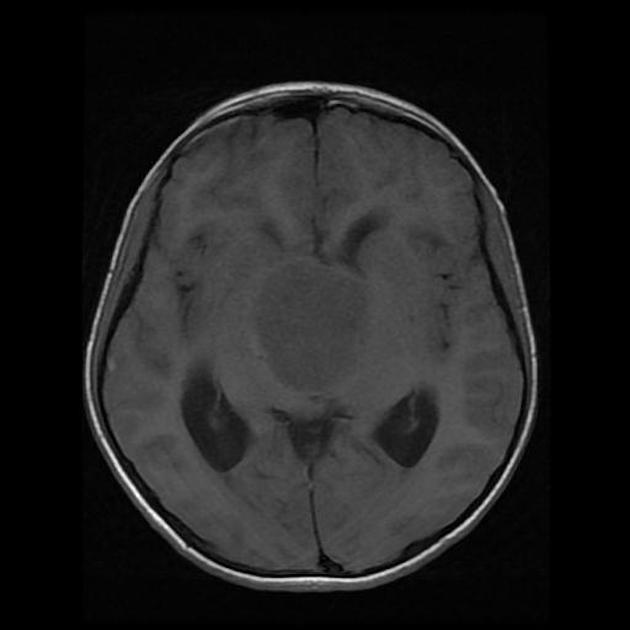

In [ ]:
mri_1

In [ ]:
mri_1=np.array(mri_1)

In [ ]:
print(mri_1.shape)
print(rank(mri_1))

(630, 630)
473


In [ ]:
U, S, V_T = svd(mri_1, full_matrices=False)

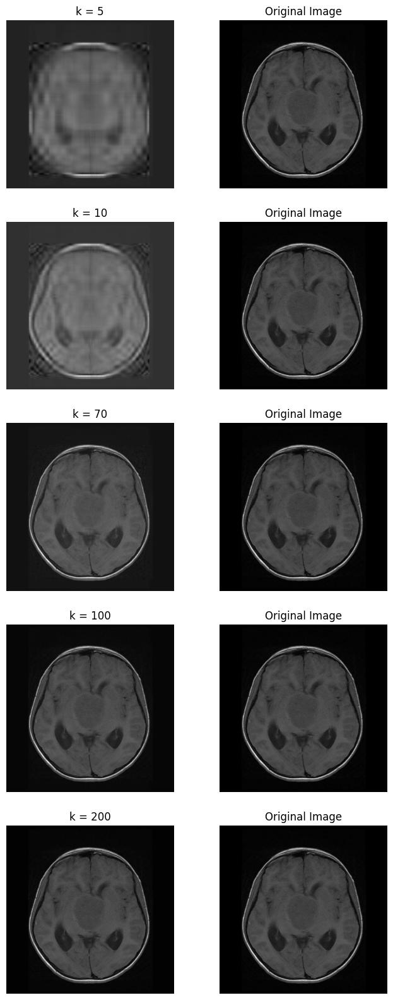

In [ ]:
S = np.diag(S)
fig, ax = plt.subplots(5, 2, figsize=(8, 20))

curr_fig = 0
for r in [5, 10, 70 , 100 , 200]:
    mri_1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    ax[curr_fig][0].imshow(mri_1_approx, cmap='gray')
    ax[curr_fig][0].set_title("k = "+str(r))
    ax[curr_fig, 0].axis('off')
    ax[curr_fig][1].set_title("Original Image")
    ax[curr_fig][1].imshow(mri_1, cmap='gray')
    ax[curr_fig, 1].axis('off')
    curr_fig += 1
plt.show()

In [ ]:
mri_1_opt = U[:, :100] @ S[0:100, :100] @ V_T[:100, :]
p = Image.fromarray(mri_1_opt)
p = cv2.imwrite('mri_1(100).png', mri_1_opt)
p = cv2.imread('mri_1(100).png')

In [ ]:
from google.colab.patches import cv2_imshow

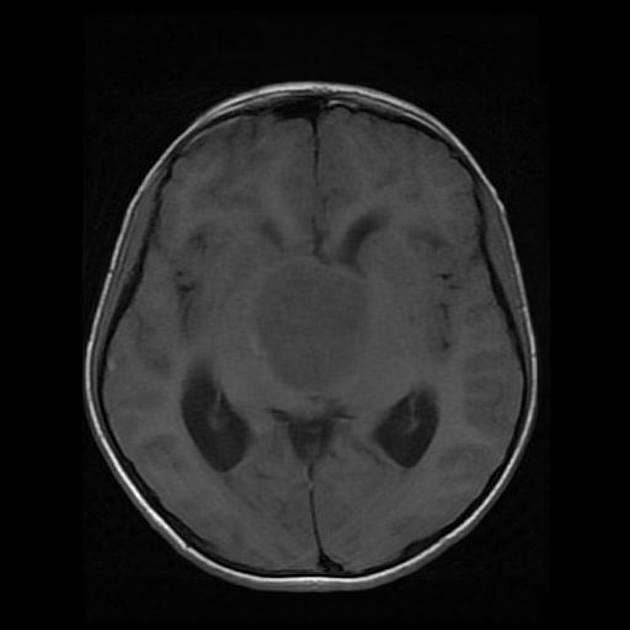

In [ ]:
cv2_imshow(p)

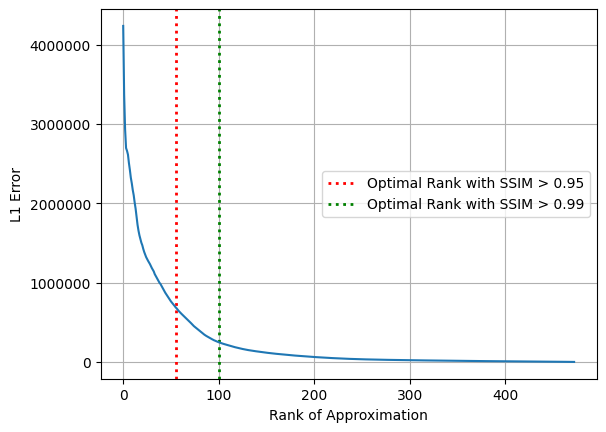

In [ ]:
L1_mri_1=[];

for r in range(1, rank(mri_1)+1):
    mri_1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L1_error=L1(mri_1, mri_1_approx)
    L1_mri_1.append(L1_error)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("L1 Error")
plt.axvline(x=55, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=100, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style='plain')
plt.plot(L1_mri_1)

In [ ]:
L1_mri_1[77]

1.0600445641219451

/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:348: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  return func(*args, **kwargs)


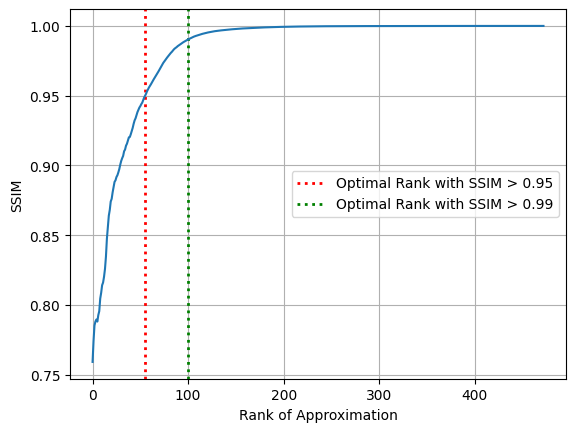

In [ ]:
SSIM_mri_1 = [];
for r in range(1, rank(mri_1)+1):
    mri_1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = ssim(mri_1, mri_1_approx)
    SSIM_mri_1.append(s)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("SSIM")
plt.axvline(x=55, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=100, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(SSIM_mri_1)

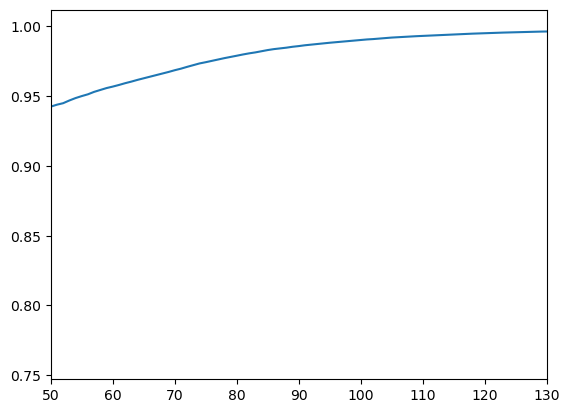

In [ ]:
SSIM_mri_1 = [];
for r in range(1, rank(mri_1)+1):
    mri_1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = ssim(mri_1, mri_1_approx)
    SSIM_mri_1.append(s)

plt.xlim(50,130)
plt.plot(SSIM_mri_1)

In [ ]:
print(SSIM_mri_1[102])

0.990969074609576


In [ ]:
mri_1_max = np.amax(mri_1)

In [ ]:
print(mri_1_max)

255


In [ ]:
st_mri_1 = np.std(mri_1)

In [ ]:
print(st_mri_1)

35.99271581067338


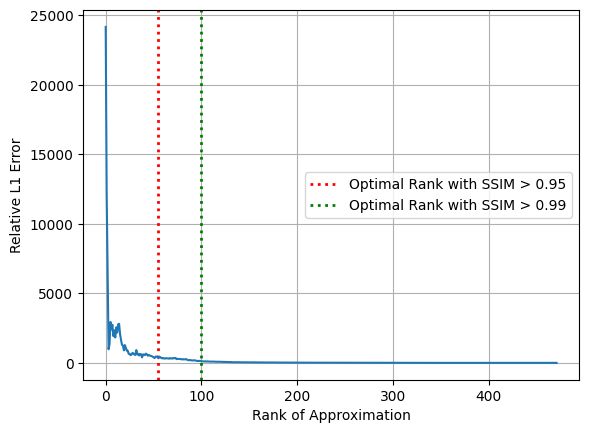

In [ ]:
#MRI Image absolute error difference #
RE_mri_1 = [];
for r in range(0, rank(mri_1)-1):
    re = abs(L1_mri_1[r+1]-L1_mri_1[r])/st_mri_1
    RE_mri_1.append(re)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("Relative L1 Error")
plt.axvline(x=55, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=100, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(RE_mri_1)

In [ ]:
RE_mri_1[154]

9.861719903318468e-05

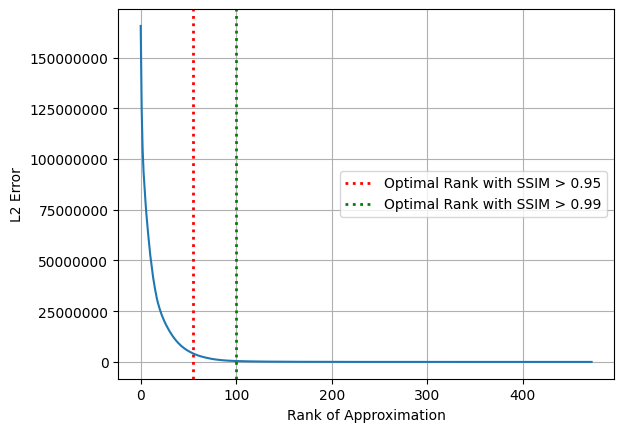

In [ ]:
L2_mri_1=[];
for r in range(1, rank(mri_1)+1):
    mri_1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L2_error=L2(mri_1, mri_1_approx)
    L2_mri_1.append(L2_error)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("L2 Error")
plt.axvline(x=55, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=100, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(L2_mri_1)


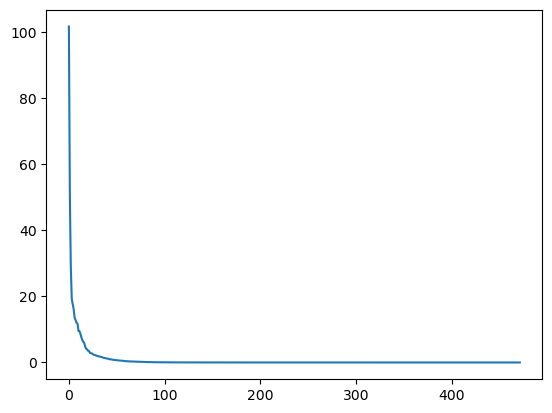

In [ ]:
#MRI Image absolute error difference #
ErrorDifference = [];
for r in range(0, rank(mri_1)-1):
    errordifference = abs(L2_mri_1[r+1]-L2_mri_1[r])
    ErrorDifference.append(errordifference)

plt.plot(ErrorDifference)

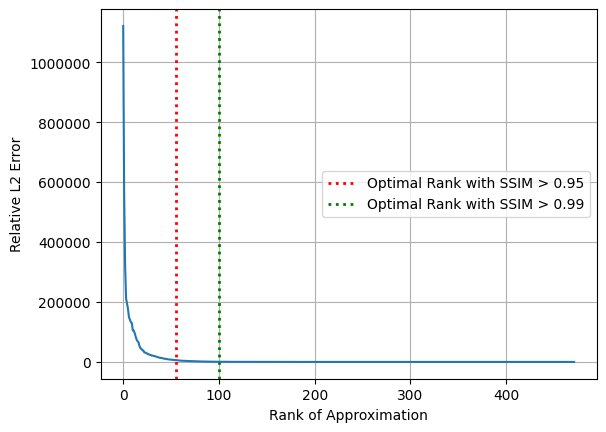

In [ ]:
#MRI Image absolute error difference #
RE_mri_12 = [];
for r in range(0, rank(mri_1)-1):
    re = abs(L2_mri_1[r+1]-L2_mri_1[r])/st_mri_1
    RE_mri_12.append(re)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("Relative L2 Error")
plt.axvline(x=55, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=100, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(RE_mri_12)

In [ ]:
RE_mri_12[171]

9.812445757422275e-05

# RE_mri_12[111]

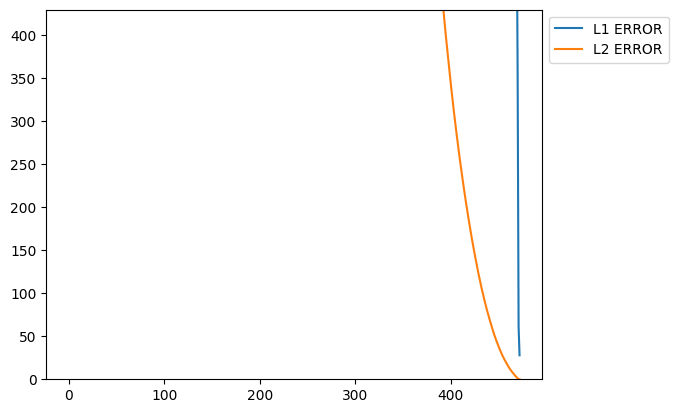

In [ ]:
L1_list_compare=[];
L2_list_compare=[];

for r in range(1, rank(mri_1)+1):
    mri_1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    l1_error = L1(mri_1, mri_1_approx)
    l2_error = L2(mri_1, mri_1_approx)
    L1_list_compare.append(l1_error)
    L2_list_compare.append(l2_error)

plt.ylim([0, 430])
plt.plot(L1_list_compare, label = 'L1 ERROR')
plt.plot(L2_list_compare, label = 'L2 ERROR')
plt.legend(bbox_to_anchor=(1,1))

In [ ]:
from math import log10, sqrt

In [ ]:
def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    psnr = 20 * log10(255/ sqrt(mse))
    return psnr

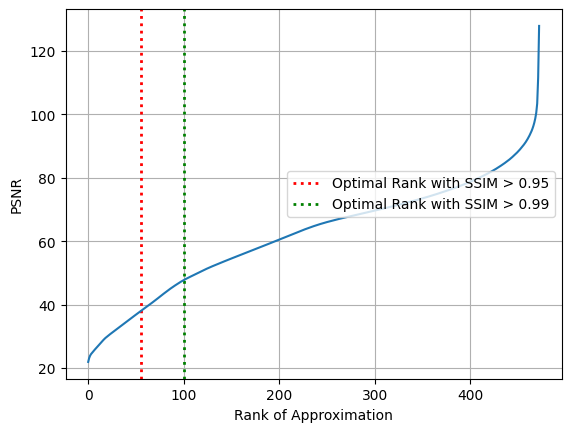

In [ ]:
PSNR_mri_1 = [];
for r in range(1, rank(mri_1)+1):
    mri_1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    psnr = PSNR(mri_1, mri_1_approx)
    PSNR_mri_1.append(psnr)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("PSNR")
plt.axvline(x=55, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=100, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(PSNR_mri_1)

In [ ]:
PSNR_mri_1[400]

78.7511035466726

In [ ]:
from mpl_toolkits.mplot3d import Axes3D


In [ ]:
np.max(mri_1)

255

In [ ]:
import statistics

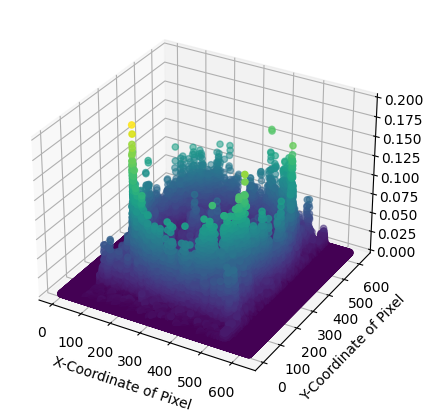

In [ ]:
Diff = [];
mri_1_95 = U[:, :55] @ S[0:55, :55] @ V_T[:55, :]
mri_1_99 = U[:, :100] @ S[0:100, :100] @ V_T[:100, :]
for x in range(0,mri_1.shape[0]):
  for y in range(0,mri_1.shape[1]):
    error = abs(mri_1[x,y] - mri_1_95[x,y])/255
    Diff.append(error)


height, width = mri_1.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_1.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.000,0.200)
plt.show()

In [ ]:
threshold = np.percentile(Diff, 75)
zero = np.zeros((630,630))

In [ ]:
zero

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
for x in range(0,mri_1.shape[0]):
  for y in range(0,mri_1.shape[1]):
    error = abs(mri_1[x,y] - mri_1_95[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


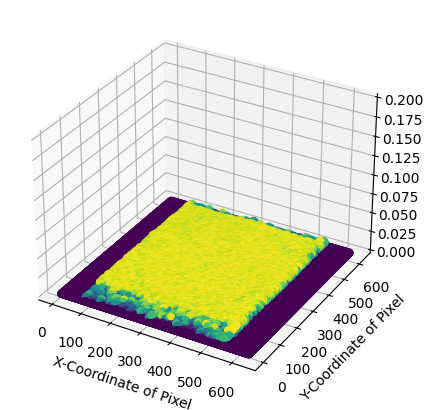

In [ ]:
Diff = [];
mri_1_95 = U[:, :55] @ S[0:55, :55] @ V_T[:55, :]
mri_1_99 = U[:, :100] @ S[0:100, :100] @ V_T[:100, :]
for x in range(0,mri_1.shape[0]):
  for y in range(0,mri_1.shape[1]):
    error = abs(mri_1[x,y] - mri_1_95[x,y])/255
    if error <= threshold:
      Diff.append(error)
    else:
      Diff.append(0)


height, width = mri_1.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_1.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.000,0.200)
plt.show()

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

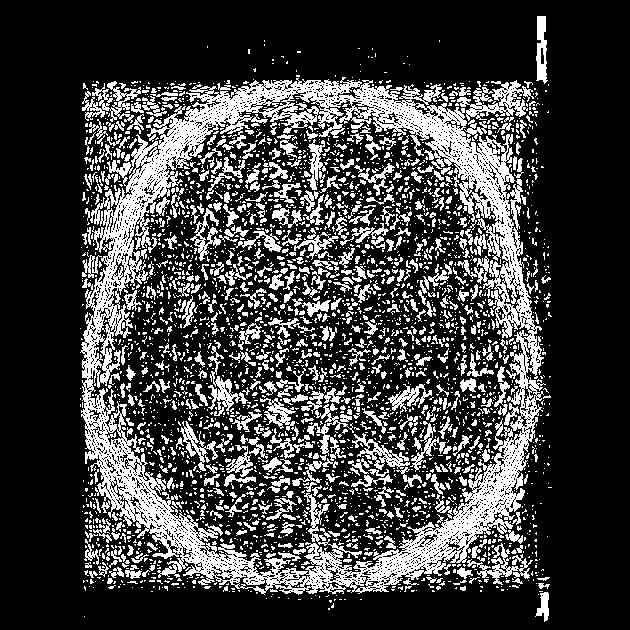

In [ ]:
cv2.imwrite('zeroimage_mri_1_95.png', zero)
z195 = cv2.imread('zeroimage_mri_1_95.png')

cv2_imshow(z195)

In [ ]:
from PIL import Image

In [ ]:
mri_1_95_pic = Image.fromarray(mri_1_95)
p = cv2.imwrite('mri_1_95_pic.png', mri_1_95)

In [ ]:
cv2_imshow(p)

AttributeError: ignored

In [ ]:
Diff = [];
mri_1_95 = U[:, :55] @ S[0:55, :55] @ V_T[:55, :]
mri_1_99 = U[:, :100] @ S[0:100, :100] @ V_T[:100, :]
for x in range(0,mri_1.shape[0]):
  for y in range(0,mri_1.shape[1]):
    error = abs(mri_1[x,y] - mri_1_95[x,y])/255
    if error > 0.05:
      cv2.circle(mri_1_95,(x,y),1,red,-1)

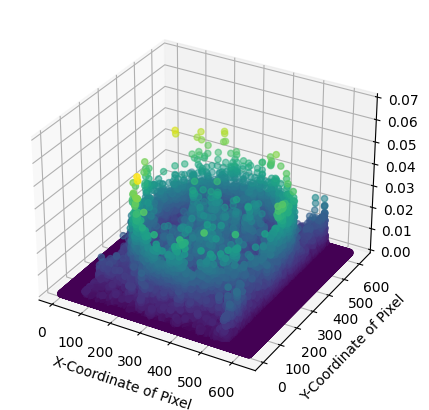

In [ ]:
Diff = [];
mri_1_95 = U[:, :55] @ S[0:55, :55] @ V_T[:55, :]
mri_1_99 = U[:, :100] @ S[0:100, :100] @ V_T[:100, :]
for x in range(0,mri_1.shape[0]):
  for y in range(0,mri_1.shape[1]):
    error = abs(mri_1[x,y] - mri_1_99[x,y])/255
    Diff.append(error)


height, width = mri_1.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_1.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0,0.070)
plt.show()

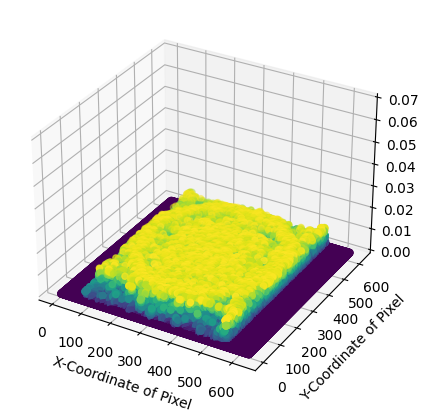

In [ ]:
Diff = [];
mri_1_95 = U[:, :55] @ S[0:55, :55] @ V_T[:55, :]
mri_1_99 = U[:, :100] @ S[0:100, :100] @ V_T[:100, :]
for x in range(0,mri_1.shape[0]):
  for y in range(0,mri_1.shape[1]):
    error = abs(mri_1[x,y] - mri_1_99[x,y])/255
    if error <= threshold:
      Diff.append(error)
    else:
      Diff.append(0)


height, width = mri_1.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_1.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.000,0.07)
plt.show()

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


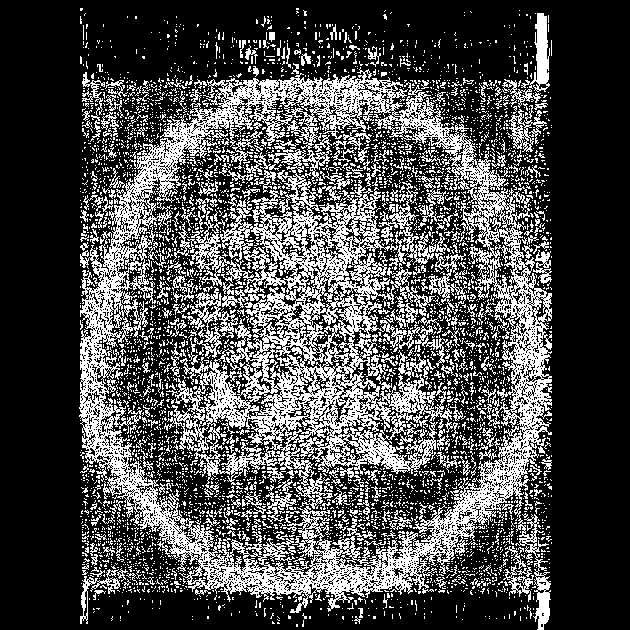

In [ ]:
threshold = np.percentile(Diff, 75)

zero = np.zeros((630,630))

for x in range(0,mri_1.shape[0]):
  for y in range(0,mri_1.shape[1]):
    error = abs(mri_1[x,y] - mri_1_99[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

cv2.imwrite('zeroimage_mri_1_99.png', zero)
z199 = cv2.imread('zeroimage_mri_1_99.png')

cv2_imshow(z199)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
from PIL import Image
mri_2 = Image.open('/content/drive/MyDrive/Copy of 0_MRI_2.jpeg')

In [ ]:
mri_2 = np.array(mri_2)

In [ ]:
print(mri_2.shape)
print(rank(mri_2))

(630, 630)


NameError: ignored

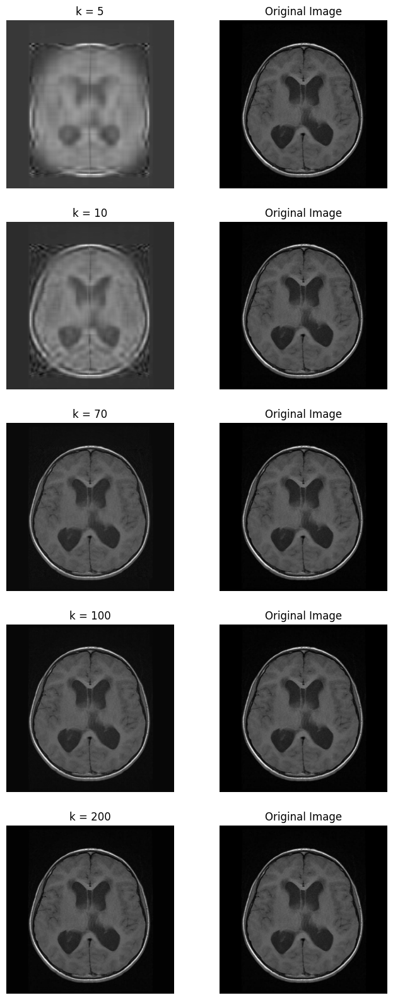

In [ ]:
U, S, V_T = svd(mri_2, full_matrices=False)
S = np.diag(S)
fig, ax = plt.subplots(5, 2, figsize=(8, 20))

curr_fig = 0
for r in [5, 10, 70 , 100 , 200]:
    mri_2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    ax[curr_fig][0].imshow(mri_2_approx, cmap='gray')
    ax[curr_fig][0].set_title("k = "+str(r))
    ax[curr_fig, 0].axis('off')
    ax[curr_fig][1].set_title("Original Image")
    ax[curr_fig][1].imshow(mri_2, cmap='gray')
    ax[curr_fig, 1].axis('off')
    curr_fig += 1
plt.show()

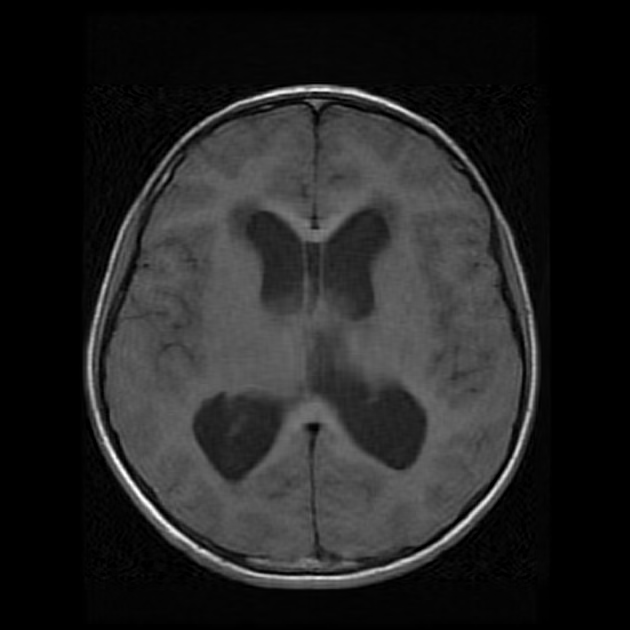

In [ ]:
mri_2_opt = U[:, :59] @ S[0:59, :59] @ V_T[:59, :]
p = Image.fromarray(mri_2_opt)
p = cv2.imwrite('mri_2(103).png', mri_2_opt)
p = cv2.imread('mri_2(103).png')
cv2_imshow(p)

In [ ]:
from google.colab.patches import cv2_imshow


In [ ]:
L1_mri_2=[];
for r in range(1, rank(mri_2)+1):
    mri_2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L1_error=L1(mri_2, mri_2_approx)
    L1_mri_2.append(L1_error)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("L1 Error")
plt.axvline(x=59, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=103, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(L1_mri_2)


In [ ]:
L1_mri_2[77]

In [ ]:
SSIM_mri_2 = [];
for r in range(1, rank(mri_2)+1):
    mri_2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = ssim(mri_2, mri_2_approx)
    SSIM_mri_2.append(s)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("SSIM")
plt.axvline(x=59, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=103, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(SSIM_mri_2)

In [ ]:
SSIM_mri_2[112]

In [ ]:
PSNR_mri_2 = [];
for r in range(1, rank(mri_2)+1):
    mri_2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = PSNR(mri_2, mri_2_approx)
    PSNR_mri_2.append(s)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("PSNR")
plt.axvline(x=59, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=103, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(PSNR_mri_2)

In [ ]:
L2_mri_2=[];
for r in range(1, rank(mri_2)+1):
    mri_2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L2_error=L2(mri_2, mri_2_approx)
    L2_mri_2.append(L2_error)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("L2 Error")
plt.axvline(x=59, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=103, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')
plt.ticklabel_format(style = 'plain')
plt.plot(L2_mri_2)


In [ ]:
st_mri_2 = np.std(mri_2)

RE_mri_21 = [];
for r in range(0, rank(mri_2)-1):
    re = abs(L1_mri_2[r+1]-L1_mri_2[r])/st_mri_2
    RE_mri_21.append(re)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("Relative L1 Error")
plt.axvline(x=59, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=103, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')
plt.plot(RE_mri_21)

In [ ]:
st_mri_2

In [ ]:
RE_mri_21[150]

In [ ]:
#MRI Image absolute error difference #
RE_mri_22 = [];
for r in range(0, rank(mri_2)-1):
    re = abs(L2_mri_2[r+1]-L2_mri_2[r])/st_mri_2
    RE_mri_22.append(re)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("Relative L2 Error")
plt.axvline(x=59, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=103, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(RE_mri_22)

In [ ]:
RE_mri_22[171]

In [ ]:
#MRI Image absolute error difference #
ErrorDifference_MRI_2 = [];
for r in range(0, rank(mri_2)-1):
    errordifference = abs(L2_mri_2[r+1]-L2_mri_2[r])
    ErrorDifference_MRI_2.append(errordifference)

plt.plot(ErrorDifference_MRI_2)

In [ ]:
#MRI Image absolute error difference #
ErrorDifference_MRI_2 = [];
for r in range(0, rank(mri_2)-1):
    errordifference = abs(L1_mri_1[r+1]-L1_mri_1[r])
    ErrorDifference_MRI_2.append(errordifference)

plt.plot(ErrorDifference_MRI_2)

In [ ]:
ErrorDifference_MRI_2[139]

In [ ]:
L1_list_compare=[];
L2_list_compare=[];

for r in range(1, rank(mri_2)+1):
    mri_2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    l1_error = L1(mri_2, mri_2_approx)
    l2_error = L2(mri_2, mri_2_approx)
    L1_list_compare.append(l1_error)
    L2_list_compare.append(l2_error)

plt.ylim([0, 600])
plt.plot(L1_list_compare, label = 'L1 ERROR')
plt.plot(L2_list_compare, label = 'L2 ERROR')
plt.legend(bbox_to_anchor=(1,1))

In [ ]:
np.max(mri_2)

255

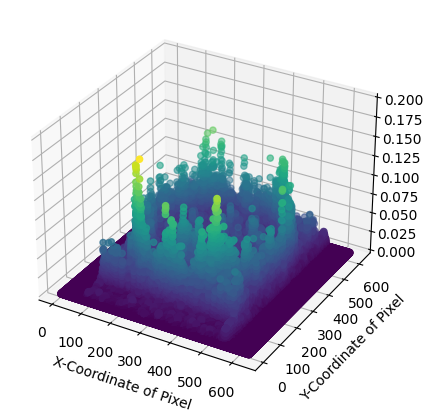

In [ ]:
Diff = [];
mri_2_95 = U[:, :59] @ S[0:59, :59] @ V_T[:59, :]
mri_2_99 = U[:, :103] @ S[0:103, :103] @ V_T[:103, :]
for x in range(0,mri_2.shape[0]):
  for y in range(0,mri_2.shape[1]):
    error = abs(mri_2[x,y] - mri_2_95[x,y])/255
    Diff.append(error)

height, width = mri_2.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_2.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.20)
plt.show()


In [ ]:
threshold = np.percentile(Diff, 75)

In [ ]:
threshold

0.009766559974820005

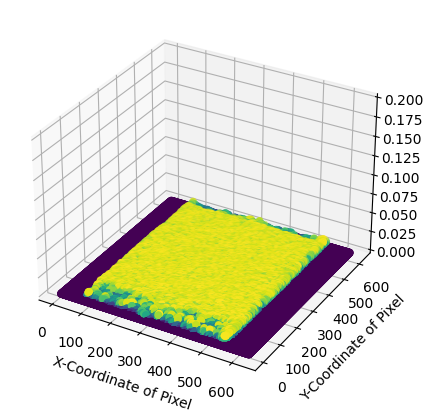

In [ ]:
Diff = [];
mri_2_95 = U[:, :59] @ S[0:59, :59] @ V_T[:59, :]
mri_2_99 = U[:, :103] @ S[0:103, :103] @ V_T[:103, :]
for x in range(0,mri_2.shape[0]):
  for y in range(0,mri_2.shape[1]):
    error = abs(mri_2[x,y] - mri_2_95[x,y])/255
    if error <= threshold:
      Diff.append(error)
    else:
      Diff.append(0)


height, width = mri_2.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_2.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.000,0.20)
plt.show()

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


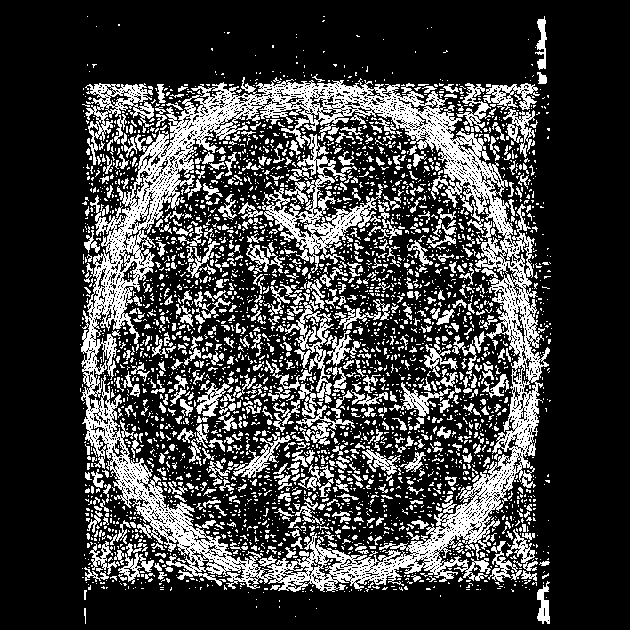

In [ ]:
zero = np.zeros((630,630))

for x in range(0,mri_2.shape[0]):
  for y in range(0,mri_2.shape[1]):
    error = abs(mri_2[x,y] - mri_2_95[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

cv2.imwrite('zeroimage_mri_2_95.png', zero)
z295 = cv2.imread('zeroimage_mri_2_95.png')

cv2_imshow(z295)


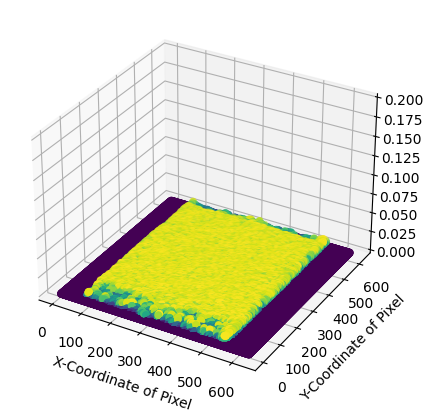

In [ ]:
Diff = [];
mri_2_95 = U[:, :59] @ S[0:59, :59] @ V_T[:59, :]
mri_2_99 = U[:, :103] @ S[0:103, :103] @ V_T[:103, :]
for x in range(0,mri_2.shape[0]):
  for y in range(0,mri_2.shape[1]):
    error = abs(mri_2[x,y] - mri_2_95[x,y])/255
    if error <= threshold:
      Diff.append(error)
    else:
      Diff.append(0)


height, width = mri_2.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_2.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.20)
plt.show()


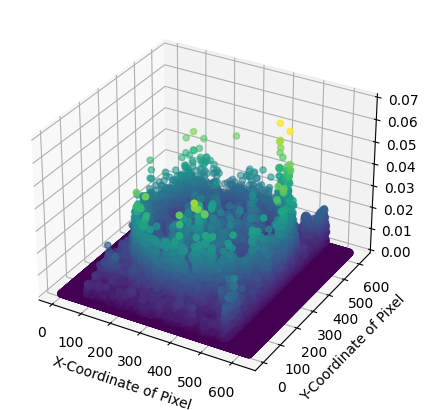

In [ ]:
Diff = [];
mri_2_95 = U[:, :59] @ S[0:59, :59] @ V_T[:59, :]
mri_2_99 = U[:, :103] @ S[0:103, :103] @ V_T[:103, :]
for x in range(0,mri_2.shape[0]):
  for y in range(0,mri_2.shape[1]):
    error = abs(mri_2[x,y] - mri_2_99[x,y])/255
    Diff.append(error)

height, width = mri_2.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_2.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.07)
plt.show()

In [ ]:
threshold = np.percentile(Diff, 75)

In [ ]:
threshold

0.0038320129992915133

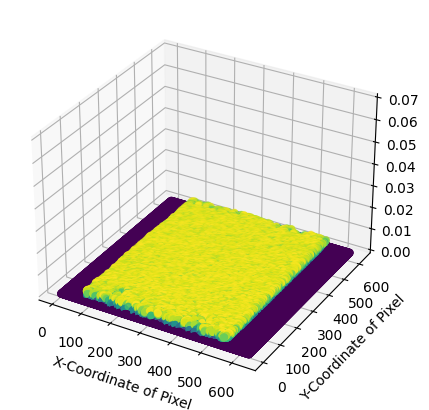

In [ ]:
Diff = [];
mri_2_95 = U[:, :59] @ S[0:59, :59] @ V_T[:59, :]
mri_2_99 = U[:, :103] @ S[0:103, :103] @ V_T[:103, :]
for x in range(0,mri_2.shape[0]):
  for y in range(0,mri_2.shape[1]):
    error = abs(mri_2[x,y] - mri_2_99[x,y])/255
    if error <= threshold:
      Diff.append(error)
    else:
      Diff.append(0)


height, width = mri_2.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_2.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.07)
plt.show()


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


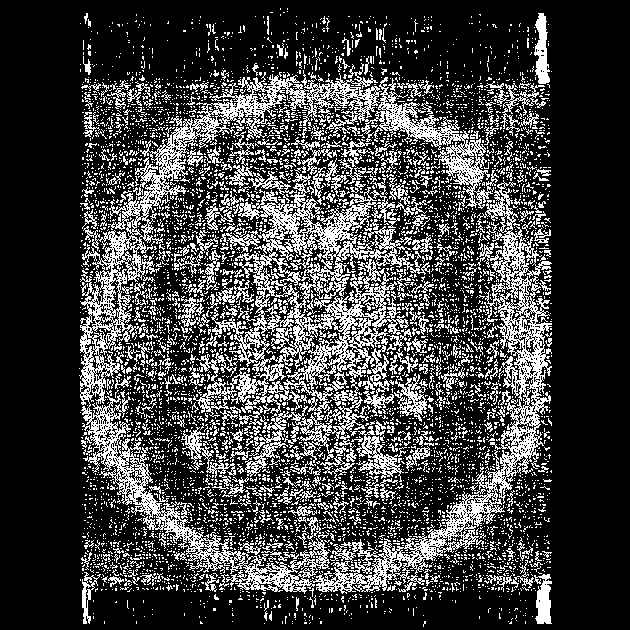

In [ ]:
zero = np.zeros((630,630))

for x in range(0,mri_2.shape[0]):
  for y in range(0,mri_2.shape[1]):
    error = abs(mri_2[x,y] - mri_2_99[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

cv2.imwrite('zeroimage_mri_2_99.png', zero)
z299 = cv2.imread('zeroimage_mri_2_99.png')

cv2_imshow(z299)


In [ ]:
from PIL import Image
mri_3 = Image.open('/content/drive/MyDrive/Copy of 0_MRI_3.png')

In [ ]:
mri_3 = np.array(mri_3)

In [ ]:
print(mri_3.shape)
print(rank(mri_3))

(630, 630)
519


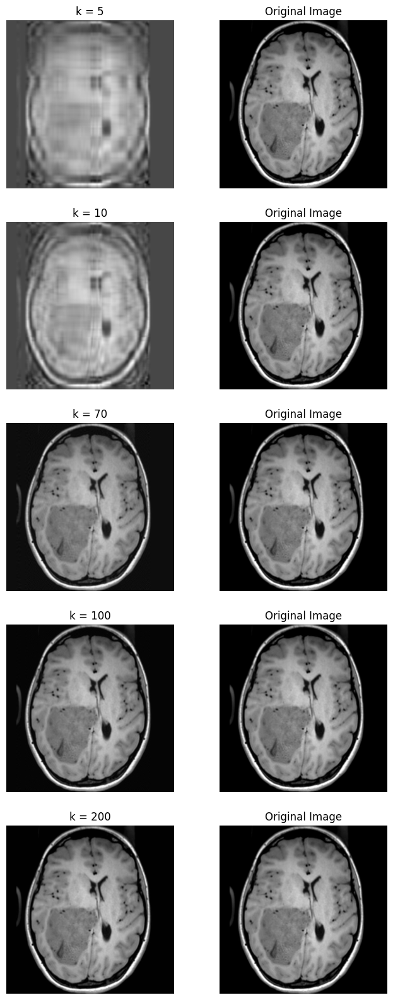

In [ ]:
U, S, V_T = svd(mri_3, full_matrices=False)
S = np.diag(S)
fig, ax = plt.subplots(5, 2, figsize=(8, 20))

curr_fig = 0
for r in [5, 10, 70 , 100 , 200]:
    mri_3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    ax[curr_fig][0].imshow(mri_3_approx, cmap='gray')
    ax[curr_fig][0].set_title("k = "+str(r))
    ax[curr_fig, 0].axis('off')
    ax[curr_fig][1].set_title("Original Image")
    ax[curr_fig][1].imshow(mri_3, cmap='gray')
    ax[curr_fig, 1].axis('off')
    curr_fig += 1
plt.show()

In [ ]:
mri_3_opt = U[:, :60] @ S[0:60, :60] @ V_T[:60, :]
p = Image.fromarray(mri_3_opt)
p = cv2.imwrite('mri_3(60).png', mri_3_opt)
p= cv2.imread('mri_3(60).png')
cv2_imshow(p)

In [ ]:
L1_mri_3=[];
for r in range(1, rank(mri_3)+1):
    mri_3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L1_error=L1(mri_3, mri_3_approx)
    L1_mri_3.append(L1_error)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("L1 Error")
plt.axvline(x=60, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=91, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(L1_mri_3)


In [ ]:
SSIM_mri_3 = [];
for r in range(1, rank(mri_3)+1):
    mri_3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = ssim(mri_3, mri_3_approx)
    SSIM_mri_3.append(s)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("SSIM")
plt.axvline(x=60, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=91, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(SSIM_mri_3)

In [ ]:
SSIM_mri_3[107]

In [ ]:
#MRI Image absolute error difference #
ErrorDifference_MRI_3 = [];
for r in range(0, rank(mri_3)-1):
    errordifference = abs(L1_mri_3[r+1]-L1_mri_3[r])
    ErrorDifference_MRI_3.append(errordifference)

plt.plot(ErrorDifference_MRI_3)

In [ ]:
ErrorDifference_MRI_3[108]

In [ ]:
L2_mri_3=[];
for r in range(1, rank(mri_3)+1):
    mri_3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L2_error=L2(mri_3, mri_3_approx)
    L2_mri_3.append(L2_error)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("L2 Error")
plt.axvline(x=60, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=91, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(L2_mri_3)


In [ ]:
#MRI Image absolute error difference #
ErrorDifference_MRI_3 = [];
for r in range(0, rank(mri_3)-1):
    errordifference = abs(L2_mri_3[r+1]-L2_mri_3[r])
    ErrorDifference_MRI_3.append(errordifference)

plt.plot(ErrorDifference_MRI_3)

In [ ]:
ErrorDifference_MRI_3[129]

In [ ]:
mri_3_max = np.amax(mri_3)

In [ ]:
print(mri_3_max)

In [ ]:
st_mri_3 = np.std(mri_3)

In [ ]:
RE_mri_31 = [];
for r in range(0, rank(mri_3)-1):
    re = abs(L1_mri_3[r+1]-L1_mri_3[r])/st_mri_3
    RE_mri_31.append(re)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("Relative L1 Error")
plt.axvline(x=60, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=91, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(RE_mri_31)

In [ ]:
RE_mri_31[119]

In [ ]:
st_mri_3

In [ ]:
RE_mri_32 = [];
for r in range(0, rank(mri_3)-1):
    re = abs(L2_mri_3[r+1]-L2_mri_3[r])/st_mri_3
    RE_mri_32.append(re)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("Relative L2 Error")
plt.axvline(x=60, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=91, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(RE_mri_32)

In [ ]:
RE_mri_32[139]

In [ ]:
PSNR_mri_3 = [];
for r in range(1, rank(mri_3)+1):
    mri_3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = PSNR(mri_3, mri_3_approx)
    PSNR_mri_3.append(s)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("PSNR")
plt.axvline(x=60, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=91, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(PSNR_mri_3)

In [ ]:
L1_list_compare=[];
L2_list_compare=[];

for r in range(1, rank(mri_3)+1):
    mri_3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    l1_error = L1(mri_3, mri_3_approx)
    l2_error = L2(mri_3, mri_3_approx)
    L1_list_compare.append(l1_error)
    L2_list_compare.append(l2_error)

plt.ylim([0,2000])
plt.plot(L1_list_compare, label = 'L1 ERROR')
plt.plot(L2_list_compare, label = 'L2 ERROR')
plt.legend(bbox_to_anchor=(1,1))

In [ ]:
np.max(mri_3)

255

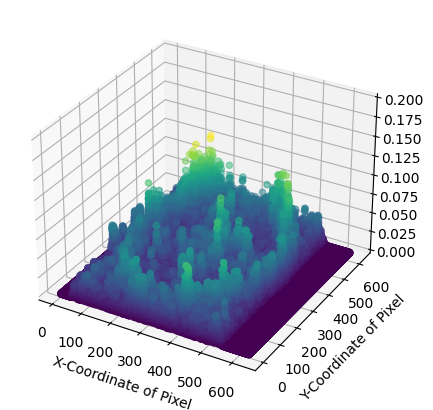

In [ ]:
Diff = [];
mri_3_95 = U[:, :60] @ S[0:60, :60] @ V_T[:60, :]
mri_3_99 = U[:, :91] @ S[0:91, :91] @ V_T[:91, :]
for x in range(0,mri_3.shape[0]):
  for y in range(0,mri_3.shape[1]):
    error = abs(mri_3[x,y] - mri_3_95[x,y])/255
    Diff.append(error)

height, width = mri_3.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_3.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.20)
plt.show()


In [ ]:
threshold = np.percentile(Diff, 75)

In [ ]:
threshold

0.010210331748513615

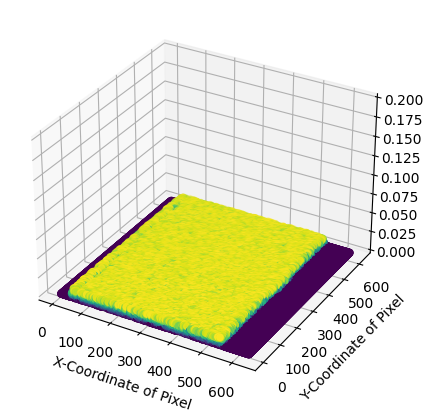

In [ ]:
Diff = [];
mri_3_95 = U[:, :60] @ S[0:60, :60] @ V_T[:60, :]
mri_3_99 = U[:, :91] @ S[0:91, :91] @ V_T[:91, :]
for x in range(0,mri_3.shape[0]):
  for y in range(0,mri_3.shape[1]):
    error = abs(mri_3[x,y] - mri_3_95[x,y])/255
    if error <= threshold:
      Diff.append(error)
    else:
      Diff.append(0)

height, width = mri_3.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_3.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.20)
plt.show()


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


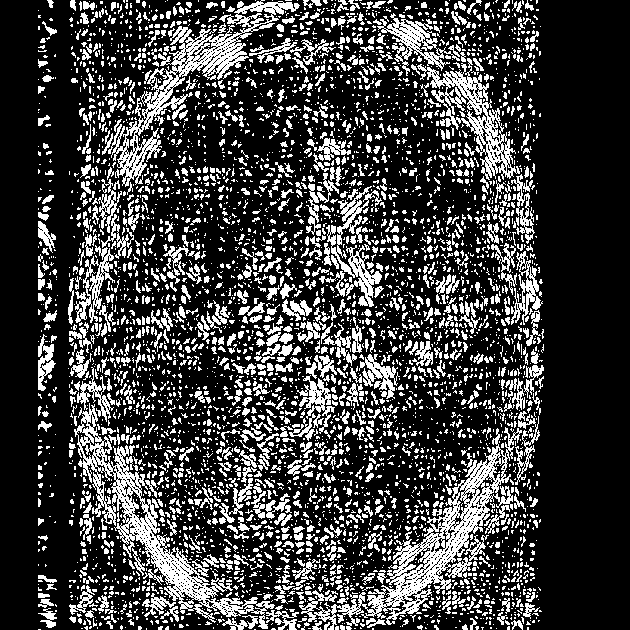

In [ ]:
zero = np.zeros((630,630))

for x in range(0,mri_3.shape[0]):
  for y in range(0,mri_3.shape[1]):
    error = abs(mri_3[x,y] - mri_3_95[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

cv2.imwrite('zeroimage_mri_3_95.png', zero)
z395 = cv2.imread('zeroimage_mri_3_95.png')

cv2_imshow(z395)


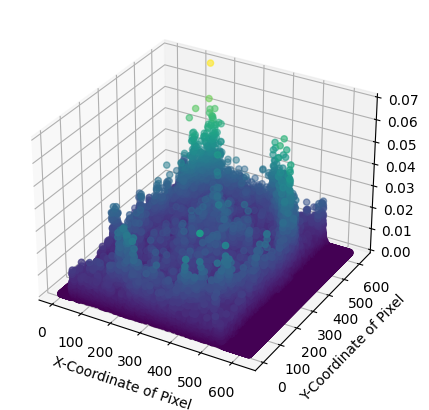

In [ ]:
Diff = [];
mri_3_95 = U[:, :60] @ S[0:60, :60] @ V_T[:60, :]
mri_3_99 = U[:, :91] @ S[0:91, :91] @ V_T[:91, :]
for x in range(0,mri_3.shape[0]):
  for y in range(0,mri_3.shape[1]):
    error = abs(mri_3[x,y] - mri_3_99[x,y])/255
    Diff.append(error)

height, width = mri_3.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize =(7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_3.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.07)
plt.show()

In [ ]:
threshold = np.percentile(Diff, 75)

In [ ]:
threshold

0.00445556640625

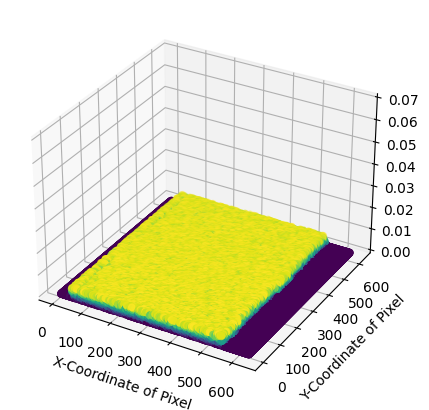

In [ ]:
Diff = [];
mri_3_95 = U[:, :60] @ S[0:60, :60] @ V_T[:60, :]
mri_3_99 = U[:, :91] @ S[0:91, :91] @ V_T[:91, :]
for x in range(0,mri_3.shape[0]):
  for y in range(0,mri_3.shape[1]):
    error = abs(mri_3[x,y] - mri_3_99[x,y])/255
    if error <= threshold:
      Diff.append(error)
    else:
      Diff.append(0)

height, width = mri_3.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize =(7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_3.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.07)
plt.show()

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


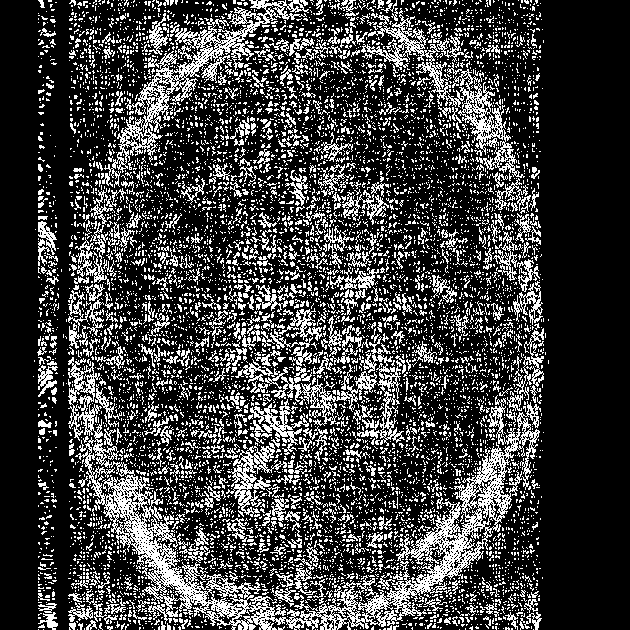

In [ ]:


zero = np.zeros((630,630))

for x in range(0,mri_3.shape[0]):
  for y in range(0,mri_3.shape[1]):
    error = abs(mri_3[x,y] - mri_3_99[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

cv2.imwrite('zeroimage_mri_3_99.png', zero)
z399 = cv2.imread('zeroimage_mri_3_99.png')

cv2_imshow(z399)


In [ ]:
mri_4 = Image.open('/content/drive/MyDrive/Copy of 0_MRI_4.png')

In [ ]:
mri_4 = np.array(mri_4)

In [ ]:
print(mri_4.shape)
print(rank(mri_4))

(630, 630)
520


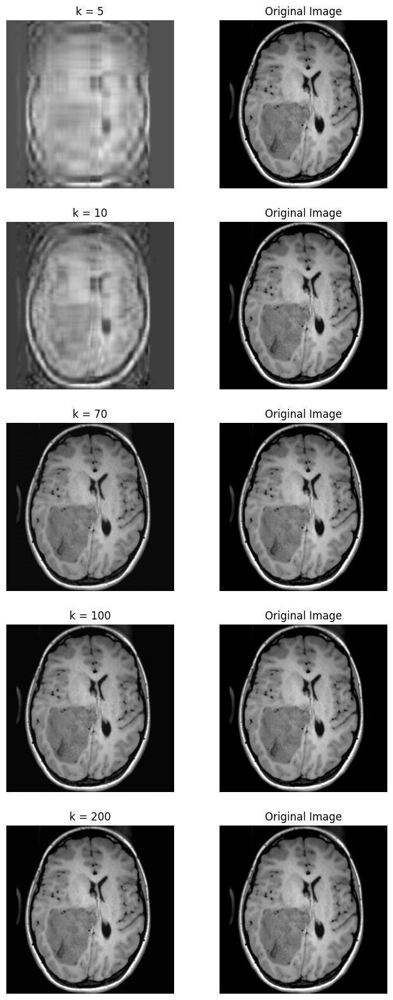

In [ ]:
U, S, V_T = svd(mri_4, full_matrices=False)
S = np.diag(S)
fig, ax = plt.subplots(5, 2, figsize=(8, 20))

curr_fig = 0
for r in [5, 10, 70 , 100 , 200]:
    mri_4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    ax[curr_fig][0].imshow(mri_4_approx, cmap='gray')
    ax[curr_fig][0].set_title("k = "+str(r))
    ax[curr_fig, 0].axis('off')
    ax[curr_fig][1].set_title("Original Image")
    ax[curr_fig][1].imshow(mri_4, cmap='gray')
    ax[curr_fig, 1].axis('off')
    curr_fig += 1
plt.show()

In [ ]:
L1_mri_4=[];
for r in range(1, rank(mri_4)+1):
    mri_4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L1_error=L1(mri_4, mri_4_approx)
    L1_mri_4.append(L1_error)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("L1 Error")
plt.axvline(x=60, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=90, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(L1_mri_4)

In [ ]:
mri_4_opt = U[:, :90] @ S[0:90, :90] @ V_T[:90, :]
p = Image.fromarray(mri_4_opt)
p = cv2.imwrite('mri_4(90).png', mri_4_opt)
p = cv2.imread('mri_4(90).png')
cv2_imshow(p)

In [ ]:
SSIM_mri_4 = [];
for r in range(1, rank(mri_4)+1):
    mri_4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = ssim(mri_4, mri_4_approx)
    SSIM_mri_4.append(s)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("SSIM")
plt.axvline(x=60, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=90, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(SSIM_mri_4)

In [ ]:
SSIM_mri_4[111]

In [ ]:
#MRI Image absolute error difference #
ErrorDifference_MRI_4 = [];
for r in range(0, rank(mri_4)-1):
    errordifference = abs(L1_mri_4[r+1]-L1_mri_4[r])
    ErrorDifference_MRI_4.append(errordifference)

plt.plot(ErrorDifference_MRI_4)

In [ ]:
st_mri_4 = np.std(mri_4)

RE_mri_41 = [];
for r in range(0, rank(mri_4)-1):
    re = abs(L1_mri_4[r+1]-L1_mri_4[r])/st_mri_4
    RE_mri_41.append(re)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("Relative L1 Error")
plt.axvline(x=60, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=90, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(RE_mri_41)

In [ ]:
st_mri_4

In [ ]:
RE_mri_41[120]

In [ ]:
ErrorDifference_MRI_4[112]

In [ ]:
L2_mri_4=[];
for r in range(1, rank(mri_4)+1):
    mri_4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L2_error=L2(mri_4, mri_4_approx)
    L2_mri_4.append(L2_error)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("L2 Error")
plt.axvline(x=60, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=90, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(L2_mri_4)


In [ ]:
#MRI Image absolute error difference #
ErrorDifference_MRI_4 = [];
for r in range(0, rank(mri_4)-1):
    errordifference = abs(L2_mri_4[r+1]-L2_mri_4[r])
    ErrorDifference_MRI_4.append(errordifference)

plt.plot(ErrorDifference_MRI_4)

In [ ]:
ErrorDifference_MRI_4[129]

In [ ]:
RE_mri_42 = [];
for r in range(0, rank(mri_4)-1):
    re = abs(L2_mri_4[r+1]-L2_mri_4[r])/st_mri_4
    RE_mri_42.append(re)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("Relative L2 Error")
plt.axvline(x=60, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=90, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(RE_mri_42)

In [ ]:
RE_mri_42[140]

In [ ]:
PSNR_mri_4 = [];
for r in range(1, rank(mri_4)+1):
    mri_4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = PSNR(mri_4, mri_4_approx)
    PSNR_mri_4.append(s)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("PSNR")
plt.axvline(x=60, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=90, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')
plt.plot(PSNR_mri_4)

In [ ]:
np.max(mri_4)

255

In [ ]:
mri_4.shape

(630, 630)

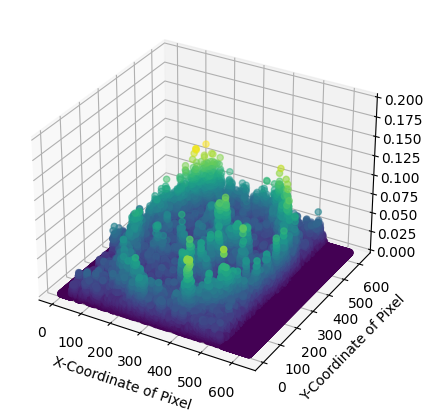

In [ ]:
Diff = [];
mri_4_95 = U[:, :60] @ S[0:60, :60] @ V_T[:60, :]
mri_4_99 = U[:, :90] @ S[0:90, :90] @ V_T[:90, :]
for x in range(0,mri_4.shape[0]):
  for y in range(0,mri_4.shape[1]):
    error = abs(mri_4[x,y] - mri_4_95[x,y])/255
    Diff.append(error)

height, width = mri_4.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_4.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.20)
plt.show()


In [ ]:
threshold = np.percentile(Diff,75)

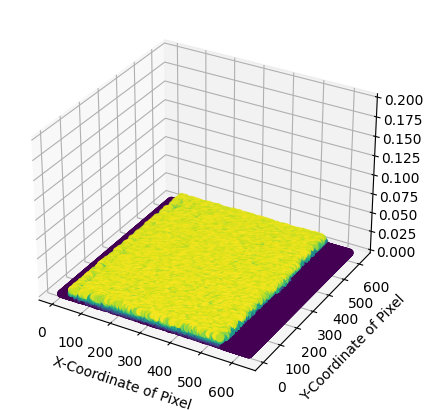

In [ ]:
Diff = [];
mri_4_95 = U[:, :60] @ S[0:60, :60] @ V_T[:60, :]
mri_4_99 = U[:, :90] @ S[0:90, :90] @ V_T[:90, :]
for x in range(0,mri_4.shape[0]):
  for y in range(0,mri_4.shape[1]):
    error = abs(mri_4[x,y] - mri_4_95[x,y])/255
    if error <= threshold:
      Diff.append(error)
    else:
      Diff.append(0)

height, width = mri_4.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_4.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.20)
plt.show()


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


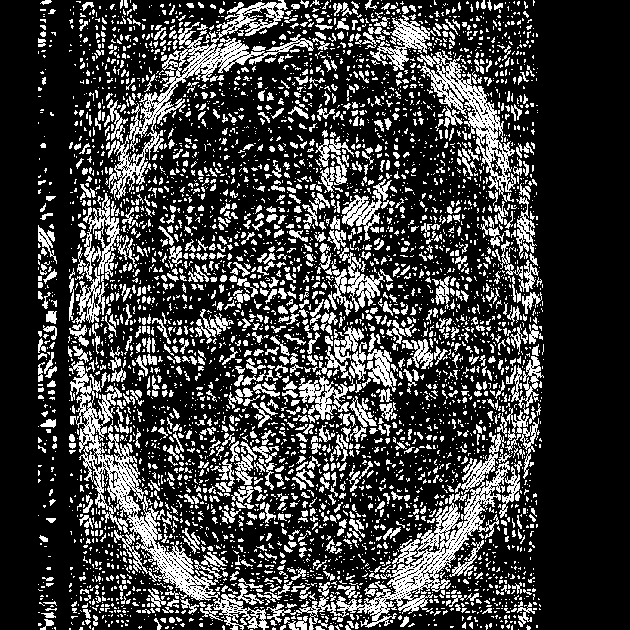

In [ ]:
zero = np.zeros((630,630))

for x in range(0,mri_4.shape[0]):
  for y in range(0,mri_4.shape[1]):
    error = abs(mri_4[x,y] - mri_4_95[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

cv2.imwrite('zeroimage_mri_4_95.png', zero)
z495 = cv2.imread('zeroimage_mri_4_95.png')

cv2_imshow(z495)


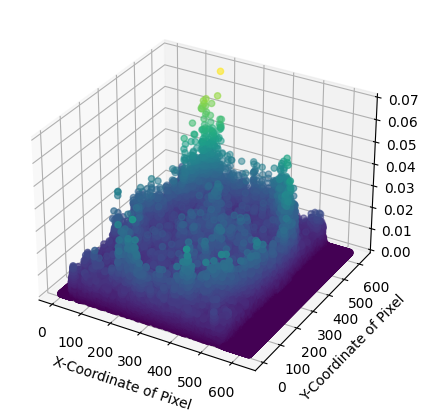

In [ ]:
Diff = [];
mri_4_95 = U[:, :60] @ S[0:60, :60] @ V_T[:60, :]
mri_4_99 = U[:, :90] @ S[0:90, :90] @ V_T[:90, :]
for x in range(0,mri_4.shape[0]):
  for y in range(0,mri_4.shape[1]):
    error = abs(mri_4[x,y] - mri_4_99[x,y])/255
    Diff.append(error)

height, width = mri_4.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_4.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.07)
plt.show()

In [ ]:
threshold = np.percentile(Diff, 75)

In [ ]:
threshold

0.004602659216114119

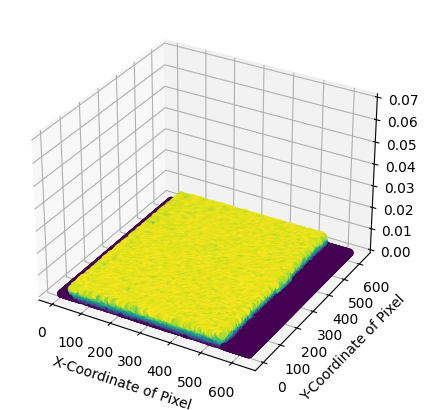

In [ ]:
Diff = [];
mri_4_95 = U[:, :60] @ S[0:60, :60] @ V_T[:60, :]
mri_4_99 = U[:, :90] @ S[0:90, :90] @ V_T[:90, :]
for x in range(0,mri_4.shape[0]):
  for y in range(0,mri_4.shape[1]):
    error = abs(mri_4[x,y] - mri_4_99[x,y])/255
    if error <= threshold:
      Diff.append(error)
    else:
      Diff.append(0)

height, width = mri_4.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(mri_4.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.07)
plt.show()

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


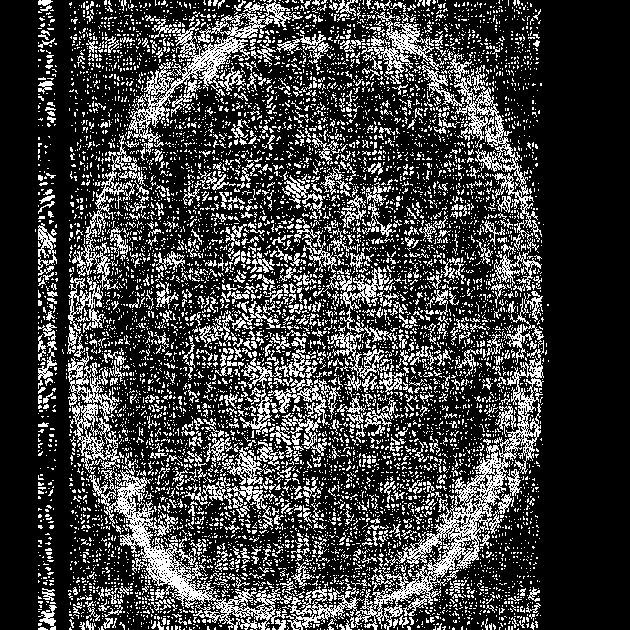

In [ ]:

zero = np.zeros((630,630))

for x in range(0,mri_4.shape[0]):
  for y in range(0,mri_4.shape[1]):
    error = abs(mri_4[x,y] - mri_4_99[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

cv2.imwrite('zeroimage_mri_4_99.png', zero)
z499 = cv2.imread('zeroimage_mri_4_99.png')

cv2_imshow(z499)


In [ ]:
L1_list_compare=[];
L2_list_compare=[];

for r in range(1, rank(mri_4)+1):
    mri_4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    l1_error = L1(mri_4, mri_4_approx)
    l2_error = L2(mri_4, mri_4_approx)
    L1_list_compare.append(l1_error)
    L2_list_compare.append(l2_error)

plt.ylim([0,2000])
plt.plot(L1_list_compare, label = 'L1 ERROR')
plt.plot(L2_list_compare, label = 'L2 ERROR')
plt.legend(bbox_to_anchor=(1,1))

In [ ]:
from PIL import Image
xray_1 = Image.open('/content/drive/MyDrive/Copy of 0_xray_1 (1).png')

In [ ]:
xray_1 = np.array(xray_1)

In [ ]:
xray_1

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [ ]:
xray_1.shape

(1857, 1857)

In [ ]:
height, width = xray_1.shape

In [ ]:
height

In [ ]:
width

In [ ]:
max(height,width)

In [ ]:
xray_1

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [ ]:
xz1 = Image.fromarray(xray_1)

In [ ]:
xz1

In [ ]:
xray_1.shape

In [ ]:
print(rank(xray_1))

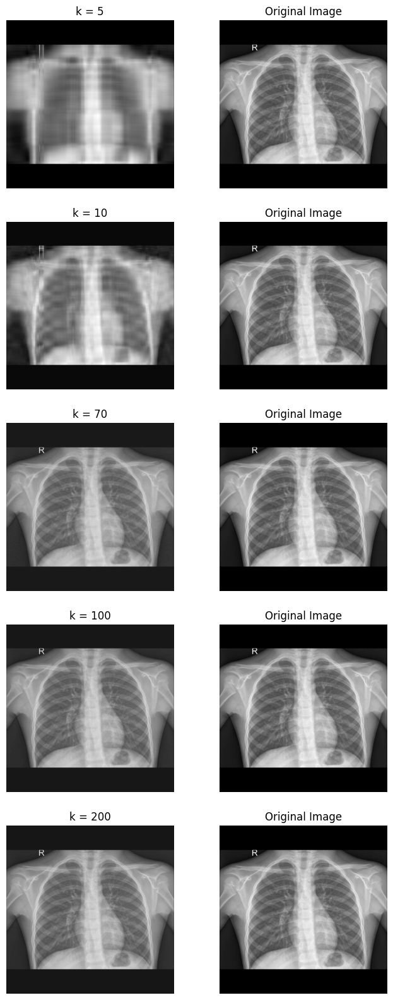

In [ ]:
U, S, V_T = svd(xray_1, full_matrices=False)
S = np.diag(S)
fig, ax = plt.subplots(5, 2, figsize=(8, 20))

curr_fig = 0
for r in [5, 10, 70 , 100 , 200]:
    xray_1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    ax[curr_fig][0].imshow(xray_1_approx, cmap='gray')
    ax[curr_fig][0].set_title("k = "+str(r))
    ax[curr_fig, 0].axis('off')
    ax[curr_fig][1].set_title("Original Image")
    ax[curr_fig][1].imshow(xray_1, cmap='gray')
    ax[curr_fig, 1].axis('off')
    curr_fig += 1
plt.show()

In [ ]:
L1_xray_1=[];
for r in range(1, rank(xray_1)+1):
    xray_1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L1_error=L1(xray_1, xray_1_approx)
    L1_xray_1.append(L1_error)


plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("L1 Error")
plt.axvline(x=208, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=493, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style= 'plain')
plt.plot(L1_xray_1)


In [ ]:
SSIM_xray_1 = [];
for r in range(1, rank(xray_1)+1):
    xray_1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = ssim(xray_1, xray_1_approx)
    SSIM_xray_1.append(s)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("SSIM")
plt.axvline(x=208, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=493, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(SSIM_xray_1)

In [ ]:
SSIM_xray_1[143]

In [ ]:
PSNR_xray_1 = [];
for r in range(1, rank(xray_1)+1):
    xray_1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    p = PSNR(xray_1, xray_1_approx)
    PSNR_xray_1.append(p)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("PSNR")
plt.axvline(x=208, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=493, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(PSNR_xray_1)

In [ ]:
#Xray Image absolute error difference #
ErrorDifference_Xray_11 = [];
for r in range(0, rank(xray_1)-1):
    errordifference = abs(L1_xray_1[r+1]-L1_xray_1[r])
    ErrorDifference_Xray_11.append(errordifference)

plt.plot(ErrorDifference_Xray_11)

In [ ]:
ErrorDifference_Xray_11[90]

In [ ]:
L2_xray_1=[];
for r in range(1, rank(xray_1)+1):
    xray_1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L2_error=L2(xray_1, xray_1_approx)
    L2_xray_1.append(L2_error)


plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("L2 Error")
plt.axvline(x=208, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=493, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(L2_xray_1)



In [ ]:
#Xray Image absolute error difference #
ErrorDifference_Xray_12 = [];
for r in range(0, rank(xray_1)-1):
    errordifference = abs(L2_xray_1[r+1]-L2_xray_1[r])
    ErrorDifference_Xray_12.append(errordifference)

plt.plot(ErrorDifference_Xray_12)

In [ ]:
ErrorDifference_Xray_12[403]

In [ ]:
st_xray_1 = np.std(xray_1)

RE_xray_11 = [];
for r in range(0, rank(xray_1)-1):
    re = abs(L1_xray_1[r+1]-L1_xray_1[r])/st_xray_1
    RE_xray_11.append(re)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("Relative L1 Error")
plt.axvline(x=208, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=493, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')
plt.plot(RE_xray_11)

In [ ]:
st_xray_1

In [ ]:
RE_xray_11[0]

In [ ]:
RE_xray_11[108]

In [ ]:
RE_xray_12 = [];
for r in range(0, rank(xray_1)-1):
    re = abs(L2_xray_1[r+1]-L2_xray_1[r])/st_xray_1
    RE_xray_12.append(re)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("Relative L2 Error")
plt.axvline(x=208, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=493, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(RE_xray_12)

In [ ]:
RE_xray_12[456]

In [ ]:
L1_list_compare=[];
L2_list_compare=[];

for r in range(1, rank(xray_1)+1):
    xray_1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    l1_error = L1(xray_1, xray_1_approx)
    l2_error = L2(xray_1, xray_1_approx)
    L1_list_compare.append(l1_error)
    L2_list_compare.append(l2_error)

plt.ylim([0,2000])
plt.plot(L1_list_compare, label = 'L1 ERROR')
plt.plot(L2_list_compare, label = 'L2 ERROR')
plt.legend(bbox_to_anchor=(1,1))

In [ ]:
xray_1_opt = U[:, :493] @ S[0:493, :493] @ V_T[:493, :]

In [ ]:
np.max(xray_1)

255

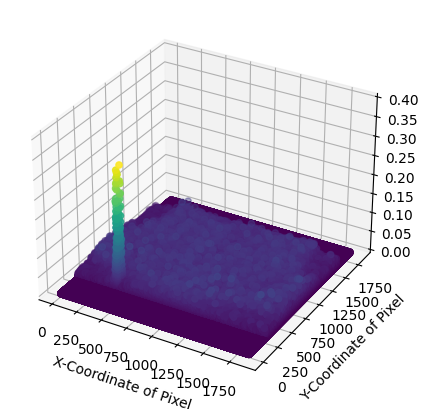

In [ ]:

Diff = [];
xray_1_95 = U[:, :208] @ S[0:208, :208] @ V_T[:208, :]
xray_1_99 = U[:, :493] @ S[0:493, :493] @ V_T[:493, :]
for x in range(0,xray_1.shape[0]):
  for y in range(0,xray_1.shape[1]):
    error = abs(xray_1[x,y] - xray_1_95[x,y])/255
    Diff.append(error)

height, width = xray_1.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_1.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.40)
plt.show()


In [ ]:
threshold = np.percentile(Diff, 75)

In [ ]:
threshold

0.009000890395220588

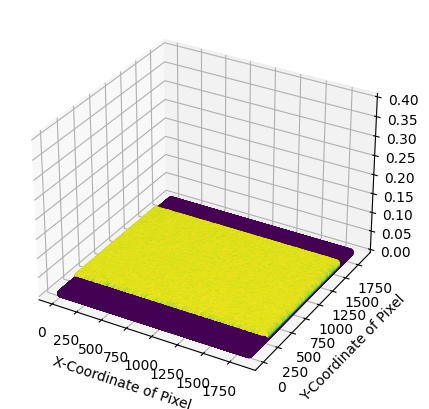

In [ ]:

Diff = [];
xray_1_95 = U[:, :208] @ S[0:208, :208] @ V_T[:208, :]
xray_1_99 = U[:, :493] @ S[0:493, :493] @ V_T[:493, :]
for x in range(0,xray_1.shape[0]):
  for y in range(0,xray_1.shape[1]):
    error = abs(xray_1[x,y] - xray_1_95[x,y])/255
    if error <= threshold:
      Diff.append(error)
    else:
      Diff.append(0)

height, width = xray_1.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_1.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.40)
plt.show()


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


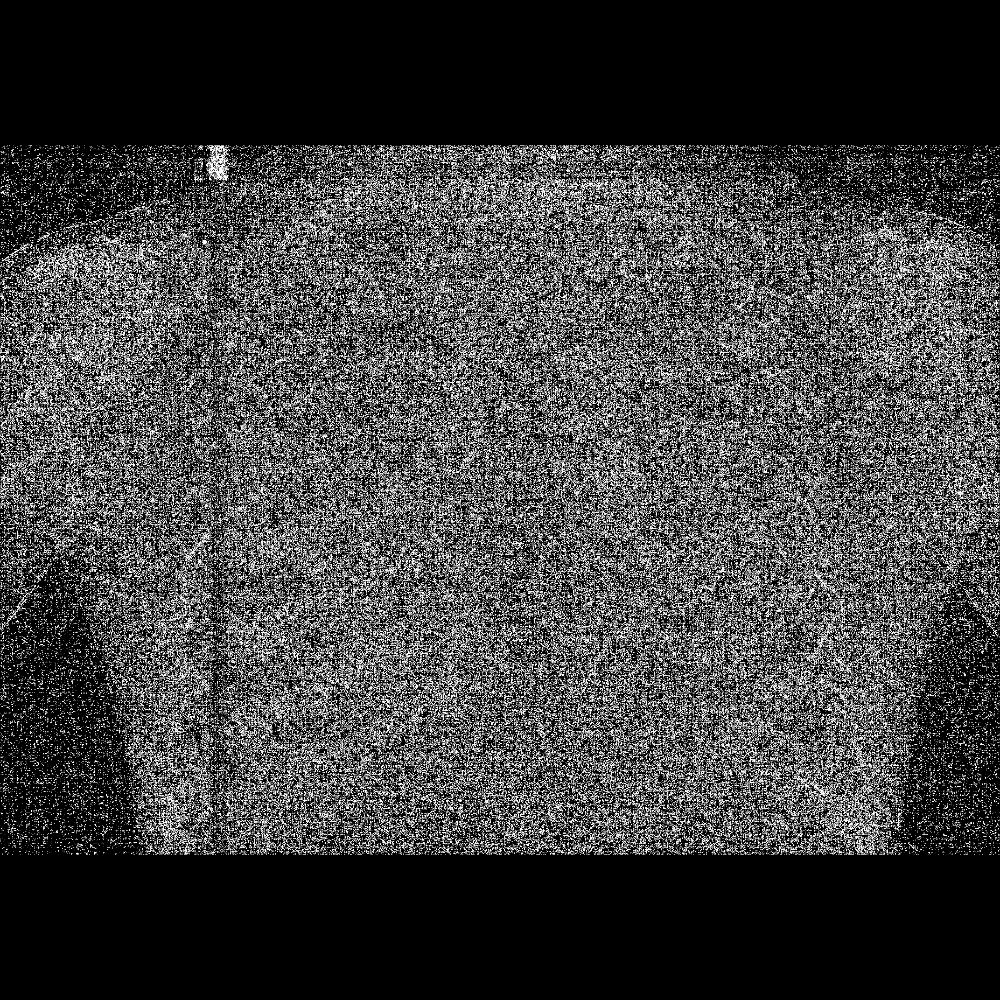

In [ ]:


zero = np.zeros((1857,1857))

for x in range(0,xray_1.shape[0]):
  for y in range(0,xray_1.shape[1]):
    error = abs(xray_1[x,y] - xray_1_95[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

cv2.imwrite('zeroimage_xray_1_95.png', zero)
s195 = cv2.imread('zeroimage_xray_1_95.png')

cv2_imshow(s195)


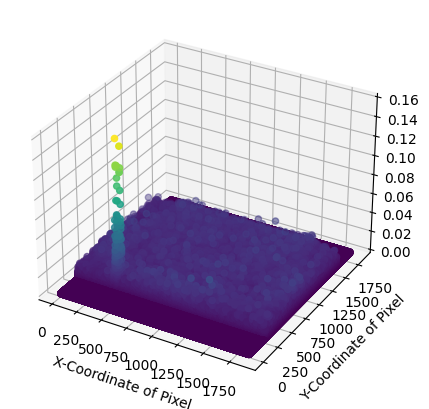

In [ ]:
Diff = [];
xray_1_95 = U[:, :208] @ S[0:208, :208] @ V_T[:208, :]
xray_1_99 = U[:, :493] @ S[0:493, :493] @ V_T[:493, :]
for x in range(0,xray_1.shape[0]):
  for y in range(0,xray_1.shape[1]):
    error = abs(xray_1[x,y] - xray_1_99[x,y])/255
    Diff.append(error)

height, width = xray_1.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (6,5) )
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_1.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.16)
plt.show()


In [ ]:
threshold = np.percentile(Diff,75)

In [ ]:
threshold

0.004042262657015932

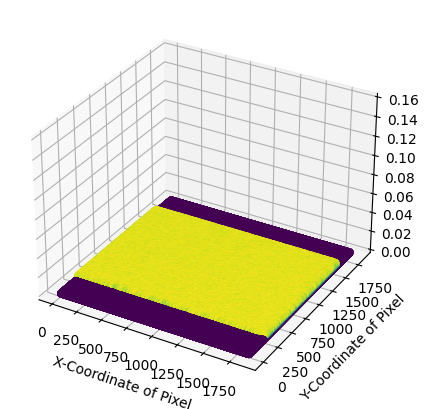

In [ ]:
Diff = [];
xray_1_95 = U[:, :208] @ S[0:208, :208] @ V_T[:208, :]
xray_1_99 = U[:, :493] @ S[0:493, :493] @ V_T[:493, :]
for x in range(0,xray_1.shape[0]):
  for y in range(0,xray_1.shape[1]):
    error = abs(xray_1[x,y] - xray_1_99[x,y])/255
    if error <= threshold:
      Diff.append(error)
    else:
      Diff.append(0)

height, width = xray_1.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (6,5) )
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_1.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.16)
plt.show()


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


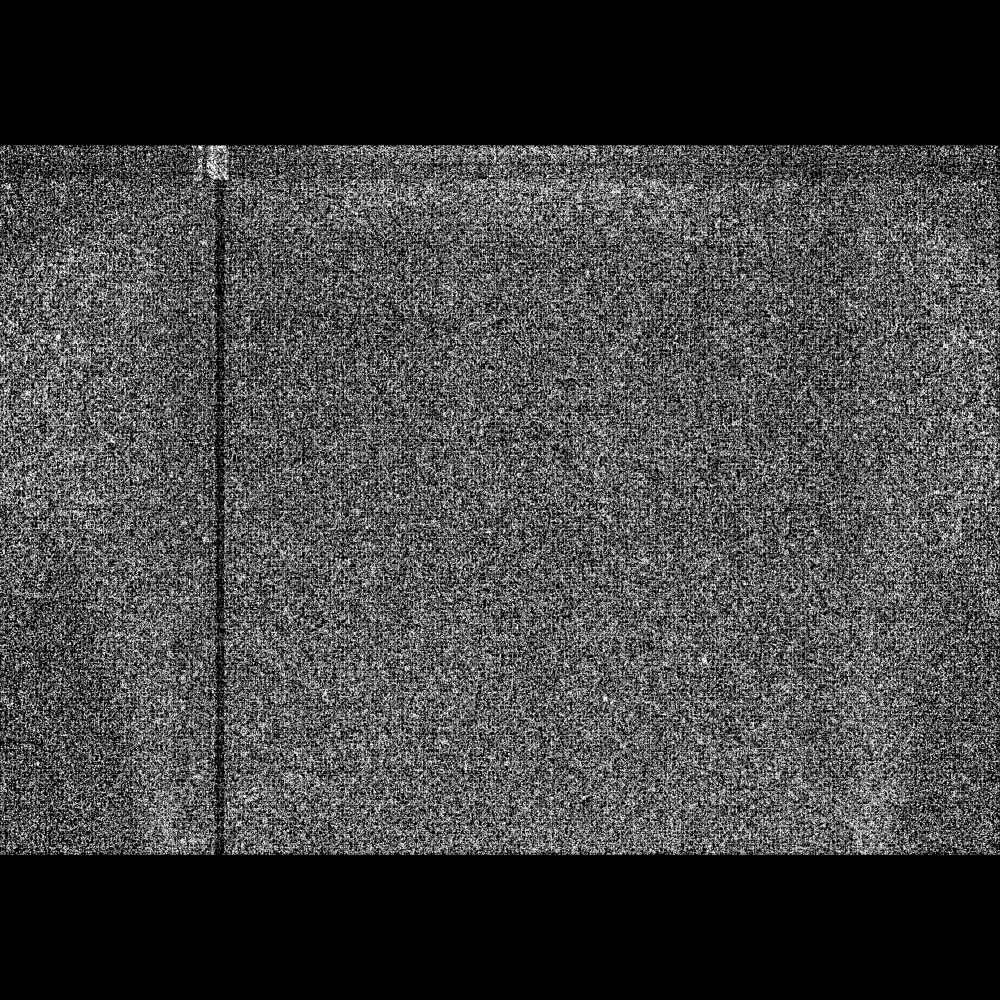

In [ ]:
zero = np.zeros((1857,1857))

for x in range(0,xray_1.shape[0]):
  for y in range(0,xray_1.shape[1]):
    error = abs(xray_1[x,y] - xray_1_99[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

cv2.imwrite('zeroimage_xray_1_99.png', zero)
s199 = cv2.imread('zeroimage_xray_1_99.png')

cv2_imshow(s199)


In [ ]:
import cv2

from PIL import Image

In [ ]:
p = Image.fromarray(xray_1_opt)
p.show()

In [ ]:
print(xray_1_opt)

In [ ]:
xray_1_diff = np.subtract(xray_1, xray_1_opt)

In [ ]:
pip install opencv-python

In [ ]:
cv2.imwrite("xray_1_diff.png", xray_1_diff)

In [ ]:
xray_1_diff = Image.open('xray_1_diff.png')

In [ ]:
xray_1_diff

In [ ]:
xray_2 = Image.open('/content/drive/MyDrive/Copy of 0_xray_2.png')

In [ ]:
xray_2 = np.array(xray_2)

In [ ]:
print(xray_2.shape)
print(rank(xray_2))

(2111, 2111)
1509


In [ ]:
height, width = xray_2.shape

In [ ]:
height

In [ ]:
width

In [ ]:
xray_2= np.pad(xray_2, pad_width=((301,301),(0,0)))

In [ ]:
xray_2

In [ ]:
xray_2.shape

In [ ]:
xz2 = Image.fromarray(xray_2)

In [ ]:
xz2

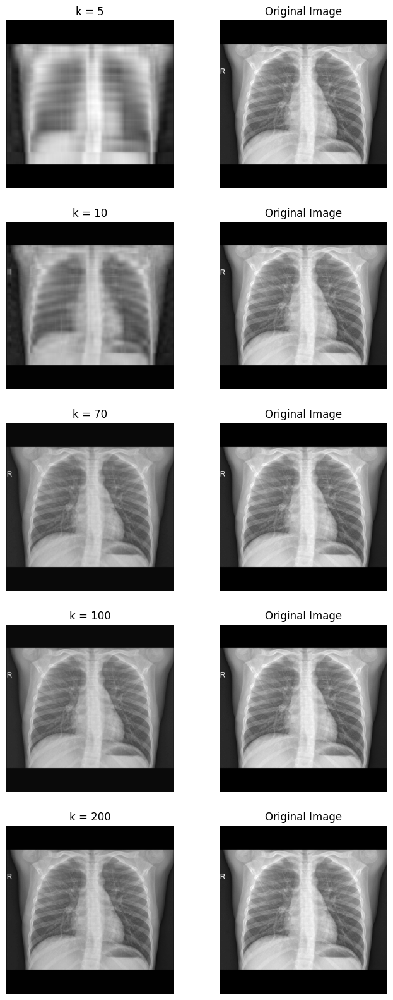

In [ ]:
U, S, V_T = svd(xray_2, full_matrices=False)
S = np.diag(S)
fig, ax = plt.subplots(5, 2, figsize=(8, 20))

curr_fig = 0
for r in [5, 10, 70 , 100 , 200]:
    xray_2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    ax[curr_fig][0].imshow(xray_2_approx, cmap='gray')
    ax[curr_fig][0].set_title("k = "+str(r))
    ax[curr_fig, 0].axis('off')
    ax[curr_fig][1].set_title("Original Image")
    ax[curr_fig][1].imshow(xray_2, cmap='gray')
    ax[curr_fig, 1].axis('off')
    curr_fig += 1
plt.show()

In [ ]:
L1_xray_2=[];
for r in range(1, rank(xray_2)+1):
    xray_2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L1_error=L1(xray_2, xray_2_approx)
    L1_xray_2.append(L1_error)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("L1 Error")
plt.axvline(x=242, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=571, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(L1_xray_2)


In [ ]:
xray_2_opt = U[:, :571] @ S[0:571, :571] @ V_T[:571, :]
p = Image.fromarray(xray_2_opt)
p.show()


In [ ]:
import multiprocessing

In [ ]:
import multiprocessing as mp
from multiprocessing import Pool

In [ ]:
mp.cpu_count()

In [ ]:
SSIM_xray_2 = [];
def pssim():
    for r in range(1, rank(xray_2)+1):
        xray_2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
        s = ssim(xray_2, xray_2_approx)
        SSIM_xray_2.append(s)
    return SSIM_xray_2

In [ ]:
p = Pool(processes = 12)

In [ ]:
result = p.map(pssim())

In [ ]:
result

In [ ]:
plt.plot(SSIM_xray_2)

In [ ]:
pip install scikit-image matplotlib opencv-python


In [ ]:
SSIM_xray_2 = [];
for r in range(1, rank(xray_2)+1):
    xray_2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = ssim(xray_2, xray_2_approx)
    SSIM_xray_2.append(s)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("SSIM")
plt.axvline(x=242, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=571, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(SSIM_xray_2)




In [ ]:
SSIM_xray_2[180]

In [ ]:
PSNR_xray_2 = [];
for r in range(1, rank(xray_2)+1):
    xray_2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    p = PSNR(xray_2, xray_2_approx)
    PSNR_xray_2.append(p)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("PSNR")
plt.axvline(x=242, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=571, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(PSNR_xray_2)

In [ ]:
#Xray Image absolute error difference #
ErrorDifference_Xray_21 = [];
for r in range(0, rank(xray_2)-1):
    errordifference = abs(L1_xray_2[r+1]-L1_xray_2[r])
    ErrorDifference_Xray_21.append(errordifference)

plt.plot(ErrorDifference_Xray_21)

In [ ]:
ErrorDifference_Xray_21[77]

In [ ]:
L2_xray_2=[];
for r in range(1, rank(xray_2)+1):
    xray_2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L2_error=L2(xray_2, xray_2_approx)
    L2_xray_2.append(L2_error)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("L2 Error")
plt.axvline(x=242, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=571, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(L2_xray_2)


In [ ]:
#Xray Image absolute error difference #
ErrorDifference_Xray_22 = [];
for r in range(0, rank(xray_2)-1):
    errordifference = abs(L2_xray_2[r+1]-L2_xray_2[r])
    ErrorDifference_Xray_22.append(errordifference)

plt.plot(ErrorDifference_Xray_22)

In [ ]:
ErrorDifference_Xray_22[426]

In [ ]:
st_xray_2 = np.std(xray_2)

RE_xray_21 = [];
for r in range(0, rank(xray_2)-1):
    re = abs(L1_xray_2[r+1]-L1_xray_2[r])/st_xray_2
    RE_xray_21.append(re)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("Relative L1 Error")
plt.axvline(x=242, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=571, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(RE_xray_21)

In [ ]:
RE_xray_21[92]

In [ ]:
st_xray_2

In [ ]:
st_xray_2

In [ ]:
RE_xray_22 = [];
for r in range(0, rank(xray_2)-1):
    re = abs(L2_xray_2[r+1]-L2_xray_2[r])/st_xray_2
    RE_xray_22.append(re)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("Relative L2 Error")
plt.axvline(x=242, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=571, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(RE_xray_22)

In [ ]:
RE_xray_22[472]

In [ ]:
L1_list_compare=[];
L2_list_compare=[];

for r in range(1, rank(xray_2)+1):
    xray_2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    l1_error = L1(xray_2, xray_2_approx)
    l2_error = L2(xray_2, xray_2_approx)
    L1_list_compare.append(l1_error)
    L2_list_compare.append(l2_error)

plt.ylim([0,2000])
plt.plot(L1_list_compare, label = 'L1 ERROR')
plt.plot(L2_list_compare, label = 'L2 ERROR')
plt.legend(bbox_to_anchor=(1,1))

In [ ]:
np.max(xray_2)

255

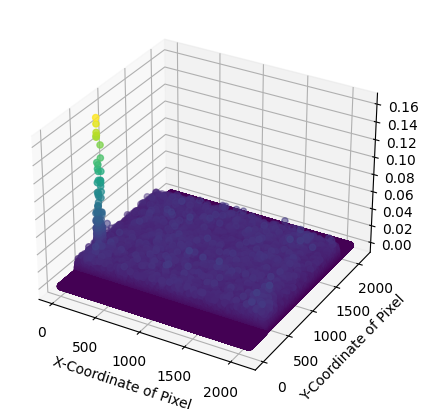

In [ ]:
Diff = [];
xray_2_95 = U[:, :242] @ S[0:242, :242] @ V_T[:242, :]
xray_2_99 = U[:, :571] @ S[0:571, :571] @ V_T[:571, :]
for x in range(0,xray_2.shape[0]):
  for y in range(0,xray_2.shape[1]):
    error = abs(xray_2[x,y] - xray_2_99[x,y])/255
    Diff.append(error)

height, width = xray_2.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (6,5) )
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_2.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')

plt.show()


In [ ]:
threshold = np.percentile(Diff,75)

In [ ]:
threshold

0.004007556391697304

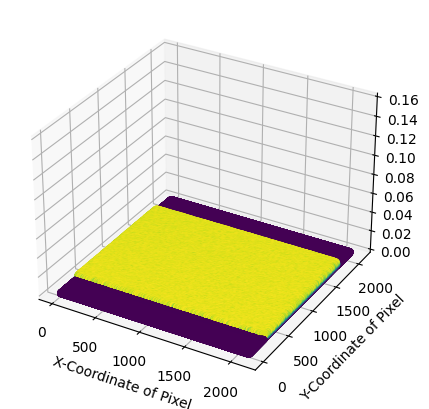

In [ ]:
Diff = [];
xray_2_95 = U[:, :242] @ S[0:242, :242] @ V_T[:242, :]
xray_2_99 = U[:, :571] @ S[0:571, :571] @ V_T[:571, :]
for x in range(0,xray_2.shape[0]):
  for y in range(0,xray_2.shape[1]):
    error = abs(xray_2[x,y] - xray_2_99[x,y])/255
    if error <= threshold:
      Diff.append(error)
    else:
      Diff.append(0)

height, width = xray_2.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (6,5) )
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_2.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00, 0.16)
plt.show()


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


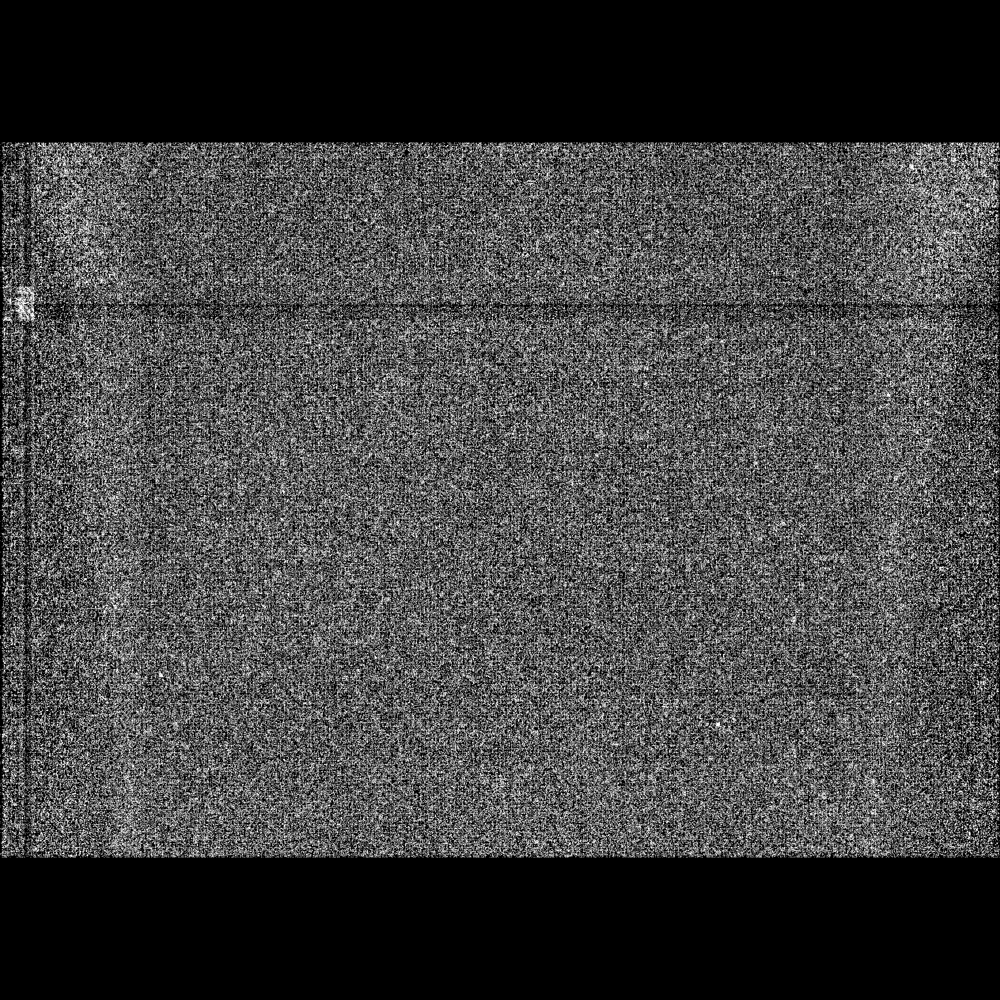

In [ ]:

zero = np.zeros((2111,2111))

for x in range(0,xray_2.shape[0]):
  for y in range(0,xray_2.shape[1]):
    error = abs(xray_2[x,y] - xray_2_99[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

cv2.imwrite('zeroimage_xray_1_95.png', zero)
s295 = cv2.imread('zeroimage_xray_1_95.png')

cv2_imshow(s295)



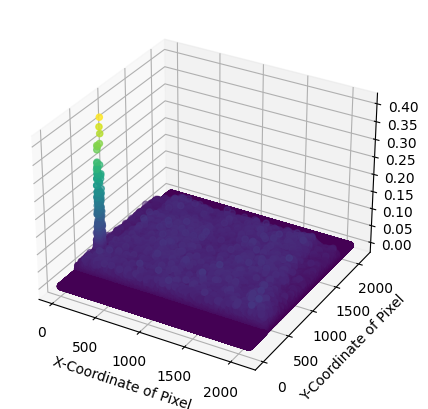

In [ ]:
Diff = [];
xray_2_95 = U[:, :242] @ S[0:242, :242] @ V_T[:242, :]
xray_2_99 = U[:, :571] @ S[0:571, :571] @ V_T[:571, :]
for x in range(0,xray_2.shape[0]):
  for y in range(0,xray_2.shape[1]):
    error = abs(xray_2[x,y] - xray_2_95[x,y])/255
    Diff.append(error)

height, width = xray_2.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (6,5) )
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_2.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim()
plt.show()

In [ ]:
threshold = np.percentile(Diff, 75)

In [ ]:
threshold

0.008876703299728094

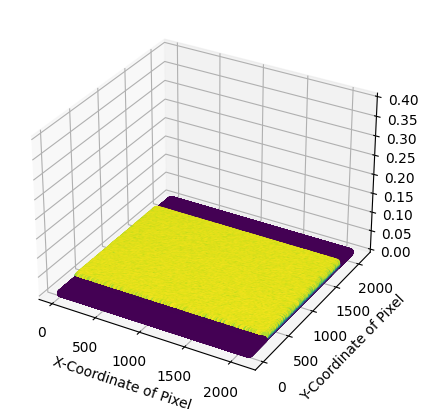

In [ ]:
Diff = [];
xray_2_95 = U[:, :242] @ S[0:242, :242] @ V_T[:242, :]
xray_2_99 = U[:, :571] @ S[0:571, :571] @ V_T[:571, :]
for x in range(0,xray_2.shape[0]):
  for y in range(0,xray_2.shape[1]):
    error = abs(xray_2[x,y] - xray_2_95[x,y])/255
    if error <= threshold:
      Diff.append(error)
    else:
      Diff.append(0)

height, width = xray_2.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (6,5) )
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_2.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.40)
plt.show()

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


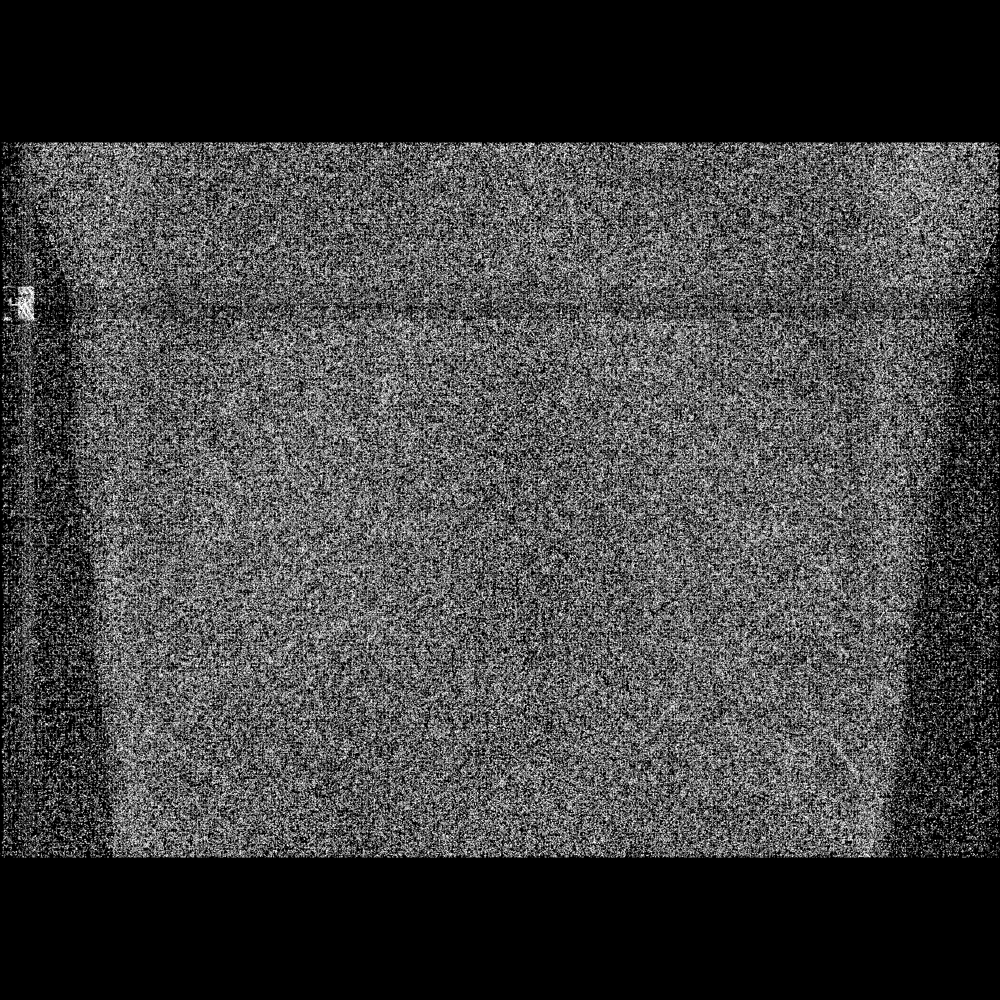

In [ ]:


zero = np.zeros((2111,2111))

for x in range(0,xray_2.shape[0]):
  for y in range(0,xray_2.shape[1]):
    error = abs(xray_2[x,y] - xray_2_95[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

cv2.imwrite('zeroimage_xray_1_99.png', zero)
s299 = cv2.imread('zeroimage_xray_1_99.png')

cv2_imshow(s299)

In [ ]:
xray_3 = Image.open('/content/drive/MyDrive/Copy of 0_xray_3.png')

In [ ]:
xray_3 = np.array(xray_3)

In [ ]:
print(xray_3.shape)
print(rank(xray_3))

(1106, 1106)
762


In [ ]:
height, width = xray_3.shape

In [ ]:
height

In [ ]:
width

In [ ]:
xray_3.shape

In [ ]:
rank(xray_3)

In [ ]:
xz3 = Image.fromarray(xray_3)

In [ ]:
xz3

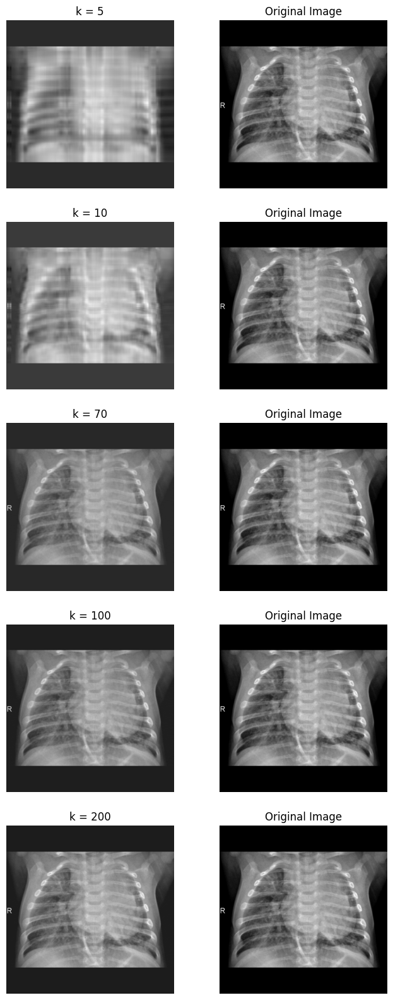

In [ ]:
U, S, V_T = svd(xray_3, full_matrices=False)
S = np.diag(S)
fig, ax = plt.subplots(5, 2, figsize=(8, 20))

curr_fig = 0
for r in [5, 10, 70 , 100 , 200]:
    xray_3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    ax[curr_fig][0].imshow(xray_3_approx, cmap='gray')
    ax[curr_fig][0].set_title("k = "+str(r))
    ax[curr_fig, 0].axis('off')
    ax[curr_fig][1].set_title("Original Image")
    ax[curr_fig][1].imshow(xray_3, cmap='gray')
    ax[curr_fig, 1].axis('off')
    curr_fig += 1
plt.show()

In [ ]:
L1_xray_3=[];
for r in range(1, rank(xray_3)+1):
    xray_3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L1_error=L1(xray_3, xray_3_approx)
    L1_xray_3.append(L1_error)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("L1 Error")
plt.axvline(x=78, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=217, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(L1_xray_3)

In [ ]:
xray_3_opt = U[:, :217] @ S[0:217, :217] @ V_T[:217, :]
p = Image.fromarray(xray_3_opt)

p.show()

In [ ]:
SSIM_xray_3 = [];
for r in range(1, rank(xray_3)+1):
    xray_3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = ssim(xray_3, xray_3_approx)
    SSIM_xray_3.append(s)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("SSIM")
plt.axvline(x=78, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=217, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(SSIM_xray_3)

In [ ]:
PSNR_xray_3 = [];
for r in range(1, rank(xray_3)+1):
    xray_3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    p = PSNR(xray_3, xray_3_approx)
    PSNR_xray_3.append(p)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("PSNR")
plt.axvline(x=78, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=217, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(PSNR_xray_3)

In [ ]:
st_xray_3 = np.std(xray_3)

RE_xray_31 = [];
for r in range(0, rank(xray_3)-1):
    re = abs(L1_xray_3[r+1]-L1_xray_3[r])/st_xray_3
    RE_xray_31.append(re)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("Relative L1 Error")
plt.axvline(x=78, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=217, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(RE_xray_31)

In [ ]:
st_xray_3

In [ ]:
RE_xray_31[116]

In [ ]:
st_xray_3

In [ ]:
#Xray Image absolute error difference #
ErrorDifference_Xray_31 = [];
for r in range(0, rank(xray_3)-1):
    errordifference = abs(L1_xray_3[r+1]-L1_xray_3[r])
    ErrorDifference_Xray_31.append(errordifference)

plt.plot(ErrorDifference_Xray_31)

In [ ]:
ErrorDifference_Xray_31[91]

In [ ]:
L2_xray_3=[];
for r in range(1, rank(xray_3)+1):
    xray_3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L2_error=L2(xray_3, xray_3_approx)
    L2_xray_3.append(L2_error)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("L2 Error")
plt.axvline(x=78, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=217, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(L2_xray_3)

In [ ]:
#Xray Image absolute error difference #
ErrorDifference_Xray_32 = [];
for r in range(0, rank(xray_3)-1):
    errordifference = abs(L2_xray_3[r+1]-L2_xray_3[r])
    ErrorDifference_Xray_32.append(errordifference)

plt.plot(ErrorDifference_Xray_32)

In [ ]:
ErrorDifference_Xray_32[234]

In [ ]:
RE_xray_32 = [];
for r in range(0, rank(xray_3)-1):
    re = abs(L2_xray_3[r+1]-L2_xray_3[r])/st_xray_3
    RE_xray_32.append(re)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("Relative L2 Error")
plt.axvline(x=78, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=217, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(RE_xray_32)

In [ ]:
RE_xray_32[268]

In [ ]:
L1_list_compare=[];
L2_list_compare=[];

for r in range(1, rank(xray_3)+1):
    xray_3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    l1_error = L1(xray_3, xray_3_approx)
    l2_error = L2(xray_3, xray_3_approx)
    L1_list_compare.append(l1_error)
    L2_list_compare.append(l2_error)

plt.ylim([0,2000])
plt.plot(L1_list_compare, label = 'L1 ERROR')
plt.plot(L2_list_compare, label = 'L2 ERROR')
plt.legend(bbox_to_anchor=(1,1))

In [ ]:
np.max(xray_3)

255

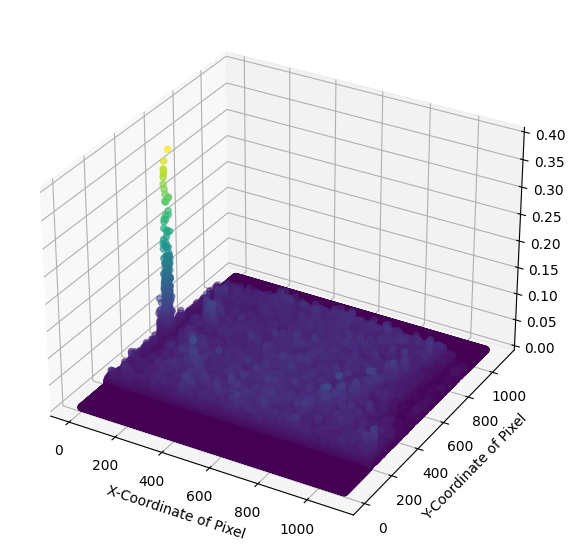

In [ ]:
Diff = [];
xray_3_95 = U[:, :78] @ S[0:78, :78] @ V_T[:78, :]
xray_3_99 = U[:, :217] @ S[0:217, :217] @ V_T[:217, :]
for x in range(0,xray_3.shape[0]):
  for y in range(0,xray_3.shape[1]):
    error = abs(xray_3[x,y] - xray_3_95[x,y])/255
    Diff.append(error)

height, width = xray_3.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (8,7) )
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_3.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.40)
plt.show()



In [ ]:
threshold = np.percentile(Diff,75)

In [ ]:
threshold

0.009247813505284927

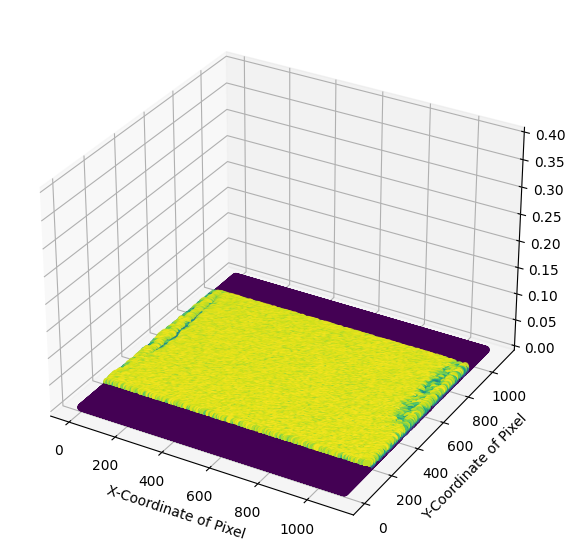

In [ ]:
Diff = [];
xray_3_95 = U[:, :78] @ S[0:78, :78] @ V_T[:78, :]
xray_3_99 = U[:, :217] @ S[0:217, :217] @ V_T[:217, :]
for x in range(0,xray_3.shape[0]):
  for y in range(0,xray_3.shape[1]):
    error = abs(xray_3[x,y] - xray_3_95[x,y])/255
    if error <= threshold:
      Diff.append(error)
    else:
      Diff.append(0)

height, width = xray_3.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (8,7) )
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_3.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.40)
plt.show()



[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


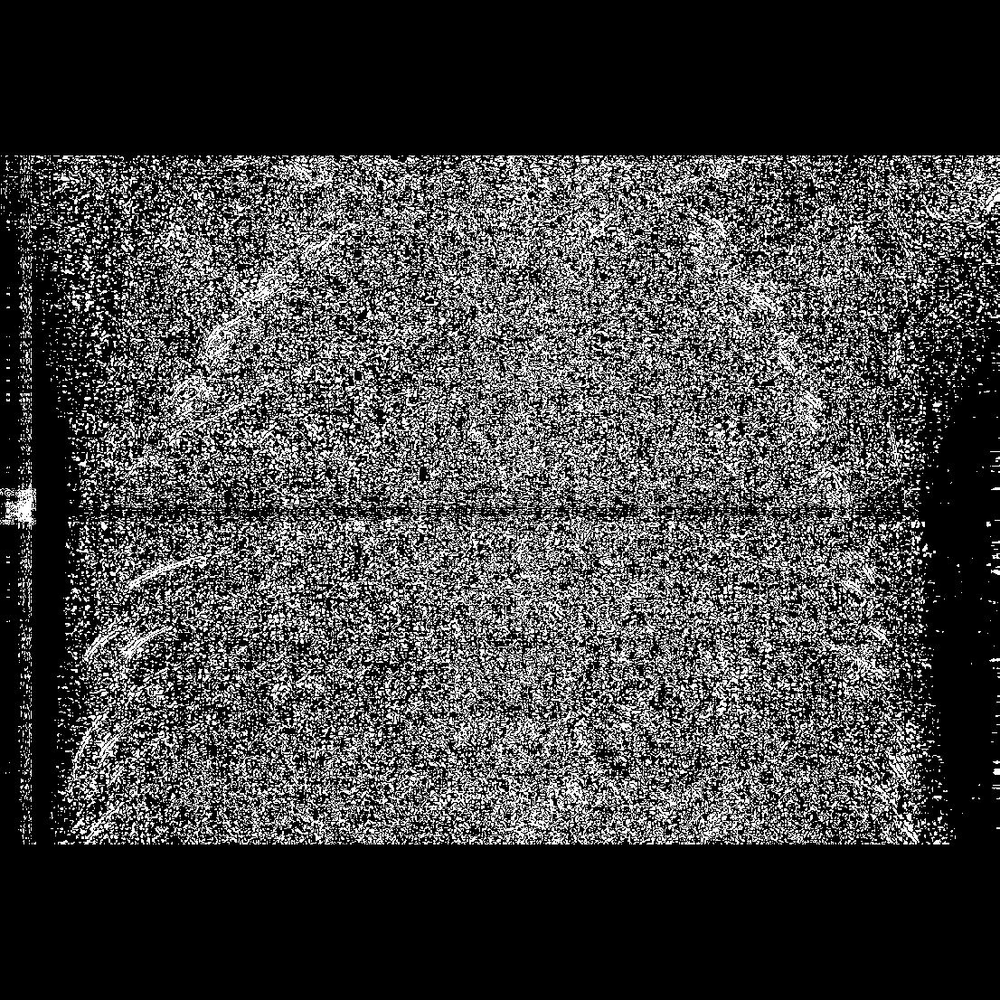

In [ ]:

zero = np.zeros((1106,1106))

for x in range(0,xray_3.shape[0]):
  for y in range(0,xray_3.shape[1]):
    error = abs(xray_3[x,y] - xray_3_95[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

cv2.imwrite('zeroimage_xray_3_95.png', zero)
s395 = cv2.imread('zeroimage_xray_3_95.png')

cv2_imshow(s395)



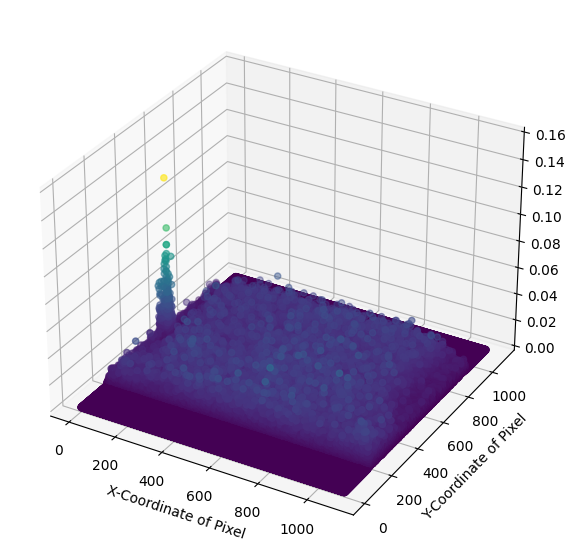

In [ ]:
Diff = [];
xray_3_95 = U[:, :78] @ S[0:78, :78] @ V_T[:78, :]
xray_3_99 = U[:, :217] @ S[0:217, :217] @ V_T[:217, :]
for x in range(0,xray_3.shape[0]):
  for y in range(0,xray_3.shape[1]):
    error = abs(xray_3[x,y] - xray_3_99[x,y])/255
    Diff.append(error)

height, width = xray_3.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (8,7) )
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_3.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.16)
plt.show()



In [ ]:
threshold = np.percentile(Diff,75)

In [ ]:
threshold

0.003899310090962578

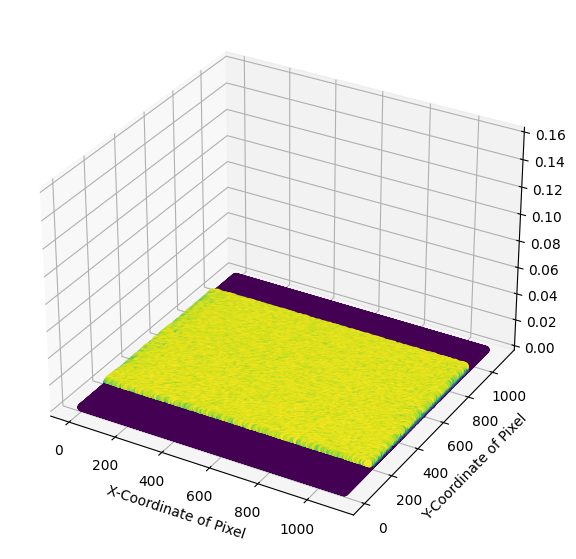

In [ ]:
Diff = [];
xray_3_95 = U[:, :78] @ S[0:78, :78] @ V_T[:78, :]
xray_3_99 = U[:, :217] @ S[0:217, :217] @ V_T[:217, :]
for x in range(0,xray_3.shape[0]):
  for y in range(0,xray_3.shape[1]):
    error = abs(xray_3[x,y] - xray_3_99[x,y])/255
    if error <= threshold:
      Diff.append(error)
    else:
      Diff.append(0)

height, width = xray_3.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (8,7) )
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_3.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.16)
plt.show()



[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


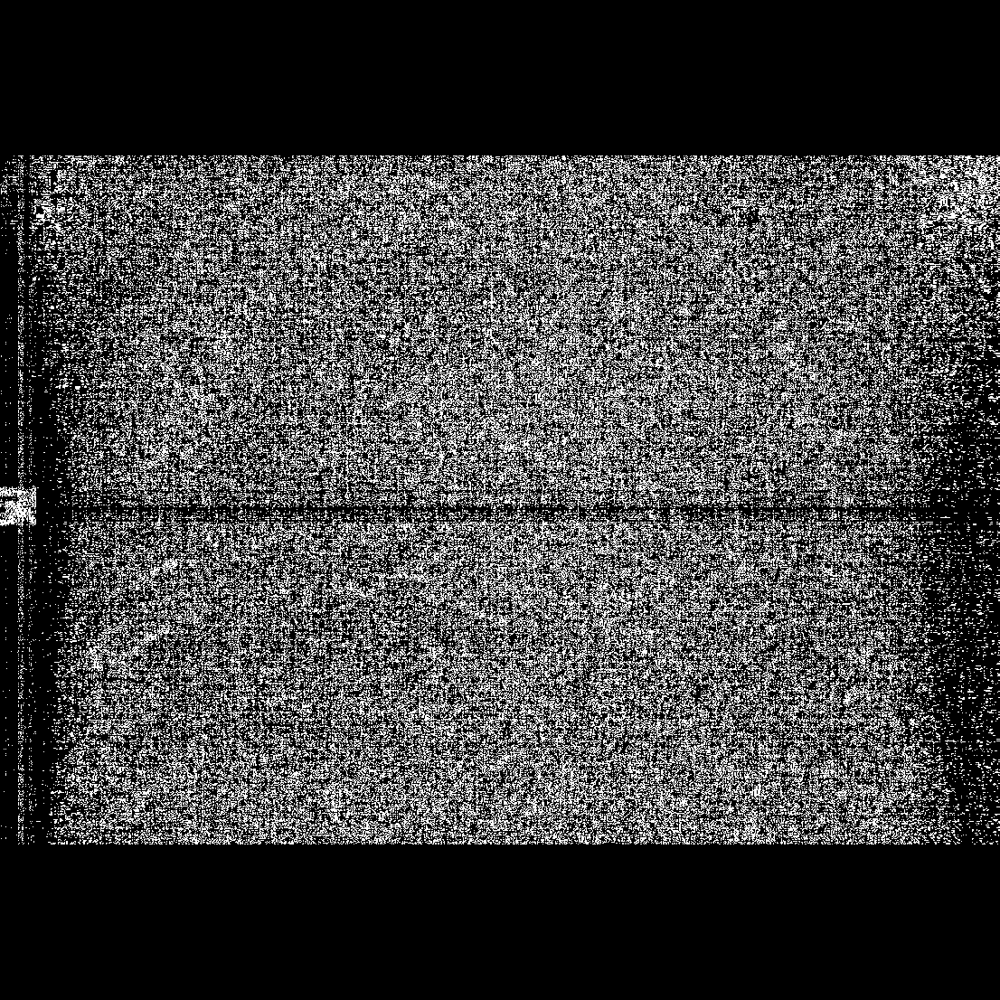

In [ ]:

zero = np.zeros((1106,1106))

for x in range(0,xray_3.shape[0]):
  for y in range(0,xray_3.shape[1]):
    error = abs(xray_3[x,y] - xray_3_99[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

cv2.imwrite('zeroimage_xray_3_99.png', zero)
s399 = cv2.imread('zeroimage_xray_3_99.png')

cv2_imshow(s399)



In [ ]:
xray_4 = Image.open('/content/drive/MyDrive/Copy of 0_xray_4.png')

In [ ]:
xray_4 = np.array(xray_4)

In [ ]:
print(xray_4.shape)
print(rank(xray_4))

(1024, 1024)
680


In [ ]:
height, width = xray_4.shape

In [ ]:
height

In [ ]:
width

In [ ]:
xray_4 = np.pad(xray_4, pad_width=((172,172),(0,0)))

In [ ]:
xray_4.shape

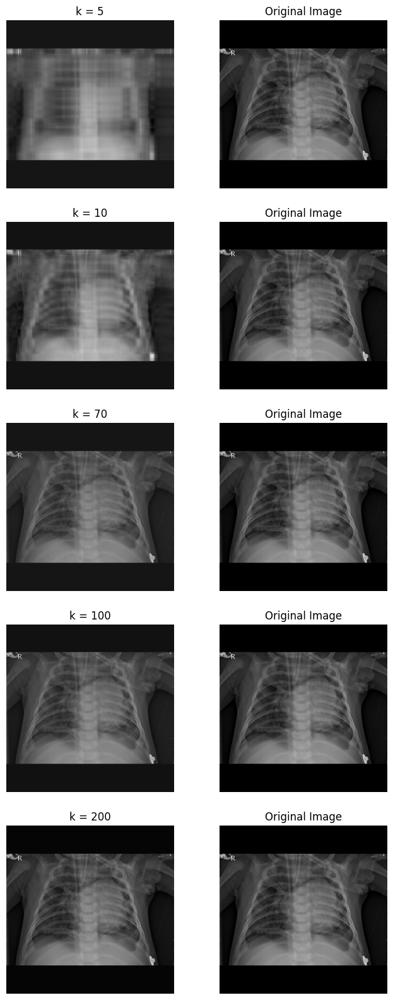

In [ ]:
U, S, V_T = svd(xray_4, full_matrices=False)
S = np.diag(S)
fig, ax = plt.subplots(5, 2, figsize=(8, 20))

curr_fig = 0
for r in [5, 10, 70 , 100 , 200]:
    xray_4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    ax[curr_fig][0].imshow(xray_4_approx, cmap='gray')
    ax[curr_fig][0].set_title("k = "+str(r))
    ax[curr_fig, 0].axis('off')
    ax[curr_fig][1].set_title("Original Image")
    ax[curr_fig][1].imshow(xray_4, cmap='gray')
    ax[curr_fig, 1].axis('off')
    curr_fig += 1
plt.show()

In [ ]:
L1_xray_4=[];
for r in range(1, rank(xray_4)+1):
    xray_4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L1_error=L1(xray_4, xray_4_approx)
    L1_xray_4.append(L1_error)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("L1 Error")
plt.axvline(x=67, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=199, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(L1_xray_4)

In [ ]:
rank(xray_4)

In [ ]:
xray_4_opt = U[:, :199] @ S[0:199, :199] @ V_T[:199, :]
p = Image.fromarray(xray_4_opt)
p.show()

In [ ]:
#Xray Image absolute error difference #
ErrorDifference_Xray_41 = [];
for r in range(0, rank(xray_4)-1):
    errordifference = abs(L1_xray_4[r+1]-L1_xray_4[r])
    ErrorDifference_Xray_41.append(errordifference)

plt.plot(ErrorDifference_Xray_41)

In [ ]:
ErrorDifference_Xray_41[91]

In [ ]:
L2_xray_4=[];
for r in range(1, rank(xray_4)+1):
    xray_4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L2_error=L2(xray_4, xray_4_approx)
    L2_xray_4.append(L2_error)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("L2 Error")
plt.axvline(x=67, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=199, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(L2_xray_4)

In [ ]:
#Xray Image absolute error difference #
ErrorDifference_Xray_42 = [];
for r in range(0, rank(xray_4)-1):
    errordifference = abs(L2_xray_4[r+1]-L2_xray_4[r])
    ErrorDifference_Xray_42.append(errordifference)

plt.plot(ErrorDifference_Xray_42)

In [ ]:
ErrorDifference_Xray_42[215]

In [ ]:
SSIM_xray_4 = [];
for r in range(1, rank(xray_4)+1):
    xray_4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = ssim(xray_4, xray_4_approx)
    SSIM_xray_4.append(s)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("SSIM")
plt.axvline(x=67, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=199, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(SSIM_xray_4)

In [ ]:
PSNR_xray_4 = [];
for r in range(1, rank(xray_4)+1):
    xray_4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    p = PSNR(xray_4, xray_4_approx)
    PSNR_xray_4.append(p)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("PSNR")
plt.axvline(x=67, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=199, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(PSNR_xray_4)

In [ ]:
st_xray_4 = np.std(xray_4)

RE_xray_41 = [];
for r in range(0, rank(xray_4)-1):
    re = abs(L1_xray_4[r+1]-L1_xray_4[r])/st_xray_4
    RE_xray_41.append(re)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("Relative L1 Error")
plt.axvline(x=67, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=199, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.plot(RE_xray_41)

In [ ]:
st_xray_4

In [ ]:
RE_xray_42 = [];
for r in range(0, rank(xray_4)-1):
    re = abs(L2_xray_4[r+1]-L2_xray_4[r])/st_xray_4
    RE_xray_42.append(re)

plt.grid()
plt.xlabel("Rank of Approximation")
plt.ylabel("Relative L2 Error")
plt.axvline(x=67, color='red', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.95")
plt.axvline(x=199, color='green', linestyle='dotted', linewidth=2, label = "Optimal Rank with SSIM > 0.99")
leg = plt.legend(loc='center right')

plt.ticklabel_format(style = 'plain')
plt.plot(RE_xray_42)

In [ ]:
RE_xray_41[155]

In [ ]:
RE_xray_42[278]

In [ ]:
st_xray_4

In [ ]:
L1_list_compare=[];
L2_list_compare=[];

for r in range(1, rank(xray_4)+1):
    xray_4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    l1_error = L1(xray_4, xray_4_approx)
    l2_error = L2(xray_4, xray_4_approx)
    L1_list_compare.append(l1_error)
    L2_list_compare.append(l2_error)

plt.ylim([0,2000])
plt.plot(L1_list_compare, label = 'L1 ERROR')
plt.plot(L2_list_compare, label = 'L2 ERROR')
plt.legend(bbox_to_anchor=(1,1))

In [ ]:
np.max(xray_4)

255

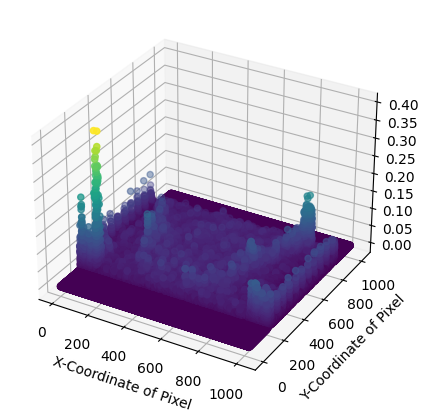

In [ ]:
Diff = [];
xray_4_95 = U[:, :67] @ S[0:67, :67] @ V_T[:67, :]
xray_4_99 = U[:, :199] @ S[0:199, :199] @ V_T[:199, :]
for x in range(0,xray_4.shape[0]):
  for y in range(0,xray_4.shape[1]):
    error = abs(xray_4[x,y] - xray_4_95[x,y])/255
    Diff.append(error)

height, width = xray_4.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (7,5) )
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_4.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')

plt.show()



In [ ]:
threshold = np.percentile(Diff, 75)

In [ ]:
threshold

0.008774882671879787

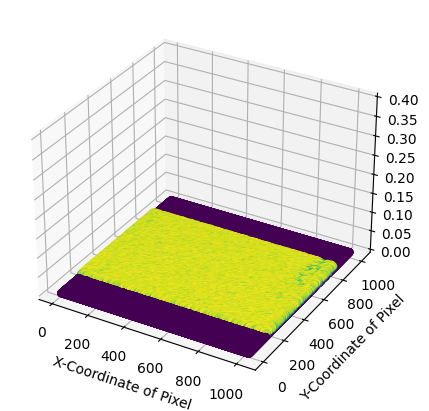

In [ ]:
Diff = [];
xray_4_95 = U[:, :67] @ S[0:67, :67] @ V_T[:67, :]
xray_4_99 = U[:, :199] @ S[0:199, :199] @ V_T[:199, :]
for x in range(0,xray_4.shape[0]):
  for y in range(0,xray_4.shape[1]):
    error = abs(xray_4[x,y] - xray_4_95[x,y])/255
    if error <= threshold:
      Diff.append(error)
    else:
      Diff.append(0)

height, width = xray_4.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (7,5) )
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_4.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.4)
plt.show()



[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


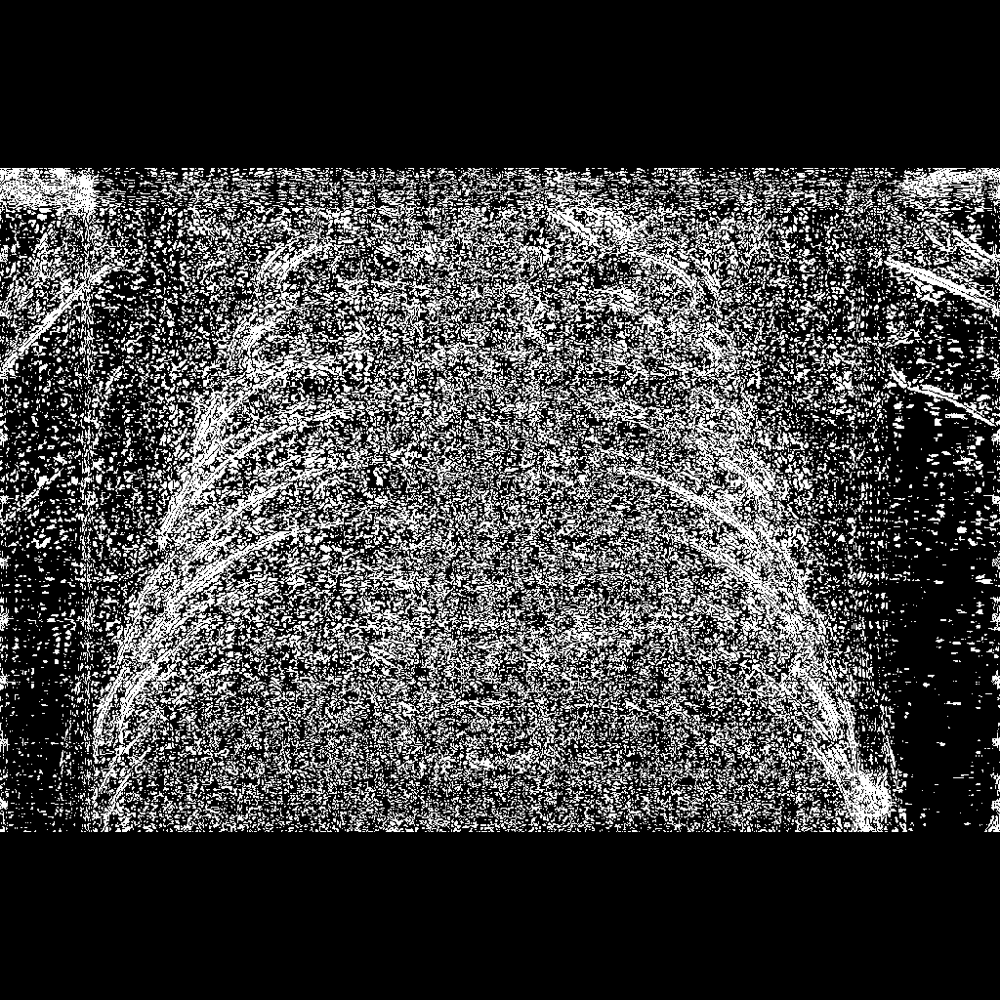

In [ ]:


zero = np.zeros((1024,1024))

for x in range(0,xray_4.shape[0]):
  for y in range(0,xray_4.shape[1]):
    error = abs(xray_4[x,y] - xray_4_95[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

cv2.imwrite('zeroimage_xray_4_95.png', zero)
s495 = cv2.imread('zeroimage_xray_4_95.png')

cv2_imshow(s495)



In [ ]:
threshold = np.percentile(Diff, 75)

zero = np.zeros((1106,1106))

for x in range(0,xray_3.shape[0]):
  for y in range(0,xray_3.shape[1]):
    error = abs(xray_3[x,y] - xray_3_95[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

cv2.imwrite('zeroimage_xray_3_95.png', zero)
s395 = cv2.imread('zeroimage_xray_3_95.png')

cv2_imshow(s395)



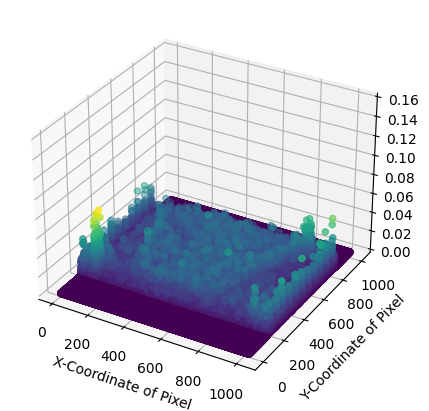

In [ ]:
Diff = [];
xray_4_95 = U[:, :67] @ S[0:67, :67] @ V_T[:67, :]
xray_4_99 = U[:, :199] @ S[0:199, :199] @ V_T[:199, :]
for x in range(0,xray_4.shape[0]):
  for y in range(0,xray_4.shape[1]):
    error = abs(xray_4[x,y] - xray_4_99[x,y])/255
    Diff.append(error)

height, width = xray_4.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (7,5) )
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_4.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.16)

plt.show()



In [ ]:
threshold = np.percentile(Diff,75)

In [ ]:
threshold

0.003569354263006472

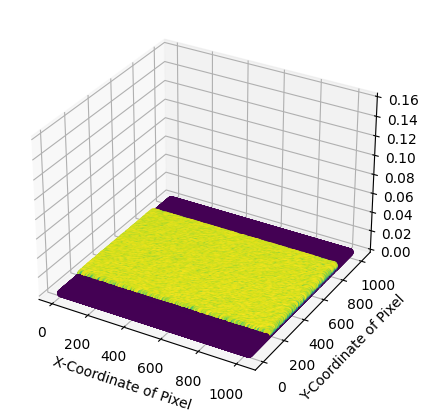

In [ ]:
Diff = [];
xray_4_95 = U[:, :67] @ S[0:67, :67] @ V_T[:67, :]
xray_4_99 = U[:, :199] @ S[0:199, :199] @ V_T[:199, :]
for x in range(0,xray_4.shape[0]):
  for y in range(0,xray_4.shape[1]):
    error = abs(xray_4[x,y] - xray_4_99[x,y])/255
    if error <= threshold:
       Diff.append(error)
    else:
      Diff.append(0)

height, width = xray_4.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (7,5) )
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_4.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.16)

plt.show()



In [ ]:
Diff = [];
xray_4_95 = U[:, :67] @ S[0:67, :67] @ V_T[:67, :]
xray_4_99 = U[:, :199] @ S[0:199, :199] @ V_T[:199, :]
for x in range(0,xray_4.shape[0]):
  for y in range(0,xray_4.shape[1]):
    error = abs(xray_4[x,y] - xray_4_99[x,y])/255
    Diff.append(error)

height, width = xray_4.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))
fig = plt.figure(figsize = (7,5) )
ax = fig.add_subplot(111, projection='3d')
surf = ax.scatter(X, Y, np.array(Diff).reshape(xray_4.shape), c = Diff, cmap='viridis')

ax.set_xlabel('X-Coordinate of Pixel')
ax.set_ylabel('Y-Coordinate of Pixel')
ax.set_zlim(0.00,0.16)

plt.show()



[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


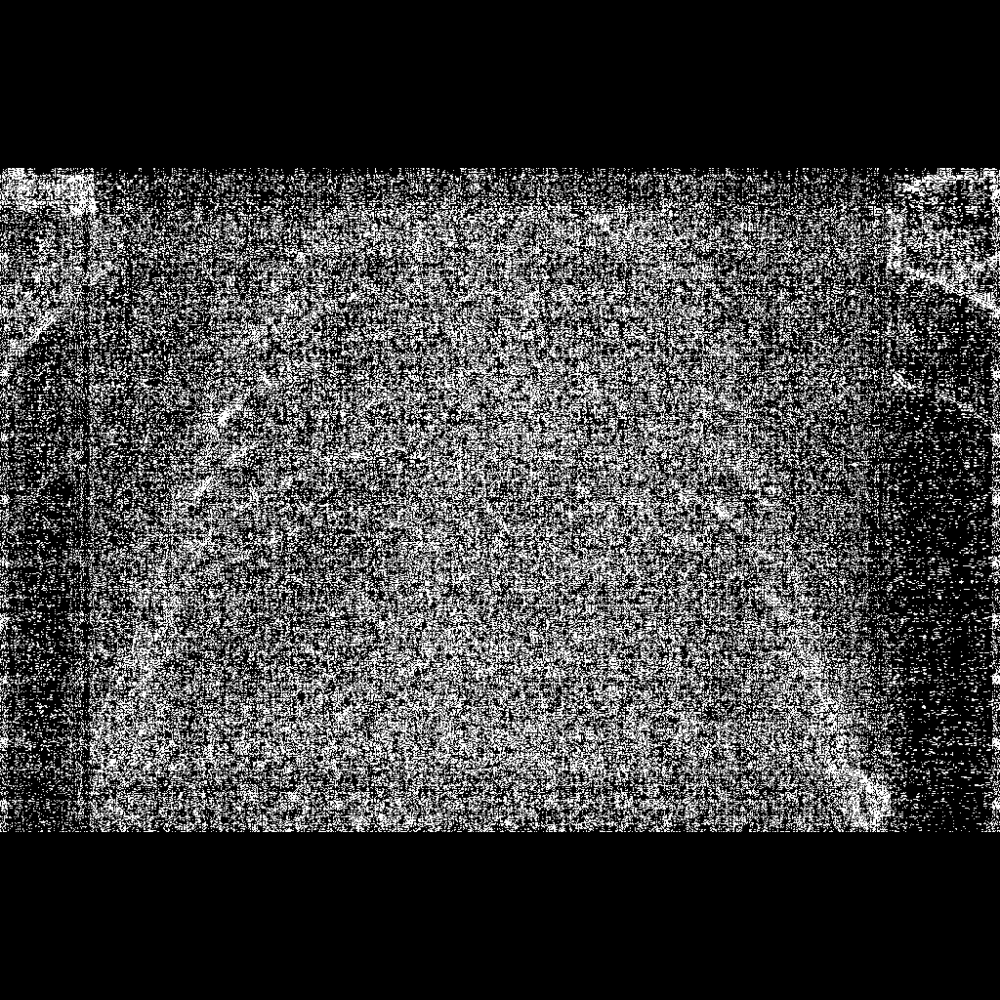

In [ ]:


zero = np.zeros((1024,1024))

for x in range(0,xray_4.shape[0]):
  for y in range(0,xray_4.shape[1]):
    error = abs(xray_4[x,y] - xray_4_99[x,y])/255
    if error > threshold:
      zero[x,y] = 255

print(zero)

cv2.imwrite('zeroimage_xray_4_99.png', zero)
s499 = cv2.imread('zeroimage_xray_4_99.png')

cv2_imshow(s499)



In [ ]:
ct1 = Image.open('c11.jpg')

In [ ]:
ct1 = np.array(ct1)

In [ ]:
print(ct1.shape)
print(rank(ct1))

In [ ]:
U, S, V_T = svd(ct1,full_matrices=False)
S = np.diag(S)
fig, ax = plt.subplots(5, 2, figsize=(8, 20))

curr_fig = 0
for r in [5, 10, 70 , 100 , 200]:
    ct1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    ax[curr_fig][0].imshow(ct1_approx, cmap='gray')
    ax[curr_fig][0].set_title("k = "+str(r))
    ax[curr_fig, 0].axis('off')
    ax[curr_fig][1].set_title("Original Image")
    ax[curr_fig][1].imshow(ct1, cmap='gray')
    ax[curr_fig, 1].axis('off')
    curr_fig += 1
plt.show()

In [ ]:
ct1_opt = U[:, :159] @ S[0:159, :159] @ V_T[:159, :]
p = Image.fromarray(ct1_opt)
ct1_diff = np.subtract(ct1, ct1_opt)
cv2.imwrite("ct1_diff.png", ct1_diff)
ct1_diff = Image.open('ct1_diff.png')
ct1_diff

In [ ]:
L1_ct1=[];
for r in range(1, rank(ct1)+1):
    ct1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L1_error=L1(ct1, ct1_approx)
    L1_ct1.append(L1_error)

plt.plot(L1_ct1)

In [ ]:
#CT Image absolute error difference #
ErrorDifference_CT_11 = [];
for r in range(0, rank(ct1)-1):
    errordifference = abs(L1_ct1[r+1]-L1_ct1[r])
    ErrorDifference_CT_11.append(errordifference)

plt.plot(ErrorDifference_CT_11)

In [ ]:
ErrorDifference_CT_11[160]

In [ ]:
L2_ct1=[];
for r in range(1, rank(ct1)+1):
    ct1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L2_error=L2(ct1, ct1_approx)
    L2_ct1.append(L2_error)

plt.plot(L2_ct1)

In [ ]:
#CT Image absolute error difference #
ErrorDifference_CT_12 = [];
for r in range(0, rank(ct1)-1):
    errordifference = abs(L2_ct1[r+1]-L2_ct1[r])
    ErrorDifference_CT_12.append(errordifference)

plt.plot(ErrorDifference_CT_12)

In [ ]:
ErrorDifference_CT_12[166]

In [ ]:
SSIM_ct1 = [];
for r in range(1, rank(ct1)+1):
    ct1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = ssim(ct1, ct1_approx)
    SSIM_ct1.append(s)

plt.plot(SSIM_ct1)

In [ ]:
PSNR_ct1 = [];
for r in range(1, rank(ct1)+1):
    ct1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = PSNR(ct1, ct1_approx)
    PSNR_ct1.append(s)

plt.plot(PSNR_ct1)

In [ ]:
st_ct1 = np.std(ct1)

RE_ct11 = [];
for r in range(0, rank(ct1)-1):
    re = abs(L1_ct1[r+1]-L1_ct1[r])/st_ct1
    RE_ct11.append(re)

plt.plot(RE_ct11)

In [ ]:

RE_ct12 = [];
for r in range(0, rank(ct1)-1):
    re = abs(L2_ct1[r+1]-L2_ct1[r])/st_ct1
    RE_ct12.append(re)

plt.plot(RE_ct12)

In [ ]:
RE_ct11[169]

In [ ]:
st_ct1

In [ ]:
RE_ct12[170]

In [ ]:
L1_list_compare=[];
L2_list_compare=[];

for r in range(1, rank(ct1)+1):
    ct1_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    l1_error = L1(ct1, ct1_approx)
    l2_error = L2(ct1, ct1_approx)
    L1_list_compare.append(l1_error)
    L2_list_compare.append(l2_error)

plt.ylim([0,4000])
plt.plot(L1_list_compare, label = 'L1 ERROR')
plt.plot(L2_list_compare, label = 'L2 ERROR')
plt.legend(bbox_to_anchor=(1,1))

In [ ]:
ct2 = Image.open('c22.jpg')

In [ ]:
ct2 = np.array(ct2)

In [ ]:
print(ct2.shape)
print(rank(ct2))

In [ ]:
U, S, V_T = svd(ct2,full_matrices=False)
S = np.diag(S)
fig, ax = plt.subplots(5, 2, figsize=(8, 20))

curr_fig = 0
for r in [5, 10, 70 , 100 , 200]:
    ct2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    ax[curr_fig][0].imshow(ct2_approx, cmap='gray')
    ax[curr_fig][0].set_title("k = "+str(r))
    ax[curr_fig, 0].axis('off')
    ax[curr_fig][1].set_title("Original Image")
    ax[curr_fig][1].imshow(ct2, cmap='gray')
    ax[curr_fig, 1].axis('off')
    curr_fig += 1
plt.show()

In [ ]:
ct2_opt = U[:, :140] @ S[0:140, :140] @ V_T[:140, :]
p = Image.fromarray(ct2_opt)
ct2_diff = np.subtract(ct2, ct2_opt)
cv2.imwrite("ct2_diff.png", ct2_diff)
ct2_diff = Image.open('ct2_diff.png')
ct2_diff

In [ ]:
L1_ct2=[];
for r in range(1, rank(ct2)+1):
    ct2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L1_error=L1(ct2, ct2_approx)
    L1_ct2.append(L1_error)

plt.plot(L1_ct2)

In [ ]:
#CT Image absolute error difference #
ErrorDifference_CT_21 = [];
for r in range(0, rank(ct2)-1):
    errordifference = abs(L1_ct2[r+1]-L1_ct2[r])
    ErrorDifference_CT_21.append(errordifference)

plt.plot(ErrorDifference_CT_21)

In [ ]:
ErrorDifference_CT_21[141]

In [ ]:
L2_ct2=[];
for r in range(1, rank(ct2)+1):
    ct2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L2_error=L2(ct2, ct2_approx)
    L2_ct2.append(L2_error)

plt.plot(L2_ct2)

In [ ]:
#CT Image absolute error difference #
ErrorDifference_CT_22 = [];
for r in range(0, rank(ct2)-1):
    errordifference = abs(L2_ct2[r+1]-L2_ct2[r])
    ErrorDifference_CT_22.append(errordifference)

plt.plot(ErrorDifference_CT_22)

In [ ]:
ErrorDifference_CT_22[151]

In [ ]:
SSIM_ct2 = [];
for r in range(1, rank(ct2)+1):
    ct2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = ssim(ct2, ct2_approx)
    SSIM_ct2.append(s)

plt.plot(SSIM_ct2)

In [ ]:
PSNR_ct2 = [];
for r in range(1, rank(ct2)+1):
    ct2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = PSNR(ct2, ct2_approx)
    PSNR_ct2.append(s)

plt.plot(PSNR_ct2)


In [ ]:
st_ct2 = np.std(ct2)

RE_ct21 = [];
for r in range(0, rank(ct2)-1):
    re = abs(L1_ct2[r+1]-L1_ct2[r])/st_ct2
    RE_ct21.append(re)

plt.plot(RE_ct21)

In [ ]:
RE_ct22 = [];
for r in range(0, rank(ct2)-1):
    re = abs(L2_ct2[r+1]-L2_ct2[r])/st_ct2
    RE_ct22.append(re)

plt.plot(RE_ct22)

In [ ]:
RE_ct21[171]

In [ ]:
RE_ct22[162]

In [ ]:
st_ct2

In [ ]:
L1_list_compare=[];
L2_list_compare=[];

for r in range(1, rank(ct2)+1):
    ct2_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    l1_error = L1(ct2, ct2_approx)
    l2_error = L2(ct2, ct2_approx)
    L1_list_compare.append(l1_error)
    L2_list_compare.append(l2_error)

plt.ylim([0,1500])
plt.plot(L1_list_compare, label = 'L1 ERROR')
plt.plot(L2_list_compare, label = 'L2 ERROR')
plt.legend(bbox_to_anchor=(1,1))

In [ ]:
ct3 = Image.open('c33.jpg')

In [ ]:
ct3 = np.array(ct3)

In [ ]:
print(ct3.shape)
print(rank(ct3))

In [ ]:
U, S, V_T = svd(ct3,full_matrices=False)
S = np.diag(S)
fig, ax = plt.subplots(5, 2, figsize=(8, 20))

curr_fig = 0
for r in [5, 10, 70 , 100 , 200]:
    ct3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    ax[curr_fig][0].imshow(ct3_approx, cmap='gray')
    ax[curr_fig][0].set_title("k = "+str(r))
    ax[curr_fig, 0].axis('off')
    ax[curr_fig][1].set_title("Original Image")
    ax[curr_fig][1].imshow(ct3, cmap='gray')
    ax[curr_fig, 1].axis('off')
    curr_fig += 1
plt.show()

In [ ]:
L1_ct3=[];
for r in range(1, rank(ct3)+1):
    ct3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L1_error=L1(ct3, ct3_approx)
    L1_ct3.append(L1_error)

plt.plot(L1_ct3)

In [ ]:
ct3_opt = U[:, :133] @ S[0:133, :133] @ V_T[:133, :]
p = Image.fromarray(ct3_opt)
ct3_diff = np.subtract(ct3, ct3_opt)
cv2.imwrite("ct3_diff.png", ct3_diff)
ct3_diff = Image.open('ct3_diff.png')
ct3_diff

In [ ]:
#CT Image absolute error difference #
ErrorDifference_CT_31 = [];
for r in range(0, rank(ct3)-1):
    errordifference = abs(L1_ct3[r+1]-L1_ct3[r])
    ErrorDifference_CT_31.append(errordifference)

plt.plot(ErrorDifference_CT_31)

In [ ]:
ErrorDifference_CT_31[134]

In [ ]:
L2_ct3=[];
for r in range(1, rank(ct3)+1):
    ct3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L2_error=L2(ct3, ct3_approx)
    L2_ct3.append(L2_error)

plt.plot(L2_ct3)

In [ ]:
#CT Image absolute error difference #
ErrorDifference_CT_32 = [];
for r in range(0, rank(ct3)-1):
    errordifference = abs(L2_list[r+1]-L2_list[r])
    ErrorDifference_CT_32.append(errordifference)

plt.plot(ErrorDifference_CT_32)

In [ ]:
ErrorDifference_CT_32[160]

In [ ]:
SSIM_ct3 = [];
for r in range(1, rank(ct3)+1):
    ct3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = ssim(ct3, ct3_approx)
    SSIM_ct3.append(s)

plt.plot(SSIM_ct3)

In [ ]:
PSNR_ct3 = [];
for r in range(1, rank(ct3)+1):
    ct3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = PSNR(ct3, ct3_approx)
    PSNR_ct3.append(s)

plt.plot(PSNR_ct3)

In [ ]:
st_ct3  = np.std(ct3)

RE_ct31 = [];
for r in range(0, rank(ct3)-1):
    re = abs(L1_ct3[r+1]-L1_ct3[r])/st_ct3
    RE_ct31.append(re)

plt.plot(RE_ct31)

In [ ]:
RE_ct32 = [];
for r in range(0, rank(ct3)-1):
    re = abs(L2_ct3[r+1]-L2_ct3[r])/st_ct3
    RE_ct32.append(re)

plt.plot(RE_ct32)

In [ ]:
RE_ct31[186]

In [ ]:
RE_ct32[179]

In [ ]:
st_ct3

In [ ]:
L1_list_compare=[];
L2_list_compare=[];

for r in range(1, rank(ct3)+1):
    ct3_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    l1_error = L1(ct3, ct3_approx)
    l2_error = L2(ct3, ct3_approx)
    L1_list_compare.append(l1_error)
    L2_list_compare.append(l2_error)

plt.ylim([0,1100])
plt.plot(L1_list_compare, label = 'L1 ERROR')
plt.plot(L2_list_compare, label = 'L2 ERROR')
plt.legend(bbox_to_anchor=(1,1))

In [ ]:
ct4 = Image.open('c44.jpg')

In [ ]:
ct4 = np.array(ct4)

In [ ]:
print(ct4.shape)
print(rank(ct4))

In [ ]:
U, S, V_T = svd(ct4,full_matrices=False)
S = np.diag(S)
fig, ax = plt.subplots(5, 2, figsize=(8, 20))

curr_fig = 0
for r in [5, 10, 70 , 100 , 200]:
    ct4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    ax[curr_fig][0].imshow(ct4_approx, cmap='gray')
    ax[curr_fig][0].set_title("k = "+str(r))
    ax[curr_fig, 0].axis('off')
    ax[curr_fig][1].set_title("Original Image")
    ax[curr_fig][1].imshow(ct4, cmap='gray')
    ax[curr_fig, 1].axis('off')
    curr_fig += 1
plt.show()

In [ ]:
L1_ct4=[];
for r in range(1, rank(ct4)+1):
    ct4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L1_error=L1(ct4, ct4_approx)
    L1_ct4.append(L1_error)

plt.plot(L1_ct4)

In [ ]:
#CT Image absolute error difference #
ErrorDifference_CT_41 = [];
for r in range(0, rank(ct4)-1):
    errordifference = abs(L1_ct4[r+1]-L1_ct4[r])
    ErrorDifference_CT_41.append(errordifference)

plt.plot(ErrorDifference_CT_41)

In [ ]:
ct4_opt = U[:, :134] @ S[0:134, :134] @ V_T[:134, :]
p = Image.fromarray(ct4_opt)
ct4_diff = np.subtract(ct4, ct4_opt)
cv2.imwrite("ct4_diff.png", ct4_diff)
ct4_diff = Image.open('ct4_diff.png')
ct4_diff

In [ ]:
ErrorDifference_CT_41[135]

In [ ]:
L2_ct4=[];
for r in range(1, rank(ct4)+1):
    ct4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L2_error=L2(ct4, ct4_approx)
    L2_ct4.append(L2_error)

plt.plot(L2_ct4)

In [ ]:
#CT Image absolute error difference #
ErrorDifference_CT_42 = [];
for r in range(0, rank(ct4)-1):
    errordifference = abs(L2_ct4[r+1]-L2_ct4[r])
    ErrorDifference_CT_42.append(errordifference)

plt.plot(ErrorDifference_CT_42)

In [ ]:
ErrorDifference_CT_42[144]

In [ ]:
SSIM_ct4 = [];
for r in range(1, rank(ct4)+1):
    ct4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = ssim(ct4, ct4_approx)
    SSIM_ct4.append(s)

plt.plot(SSIM_ct4)

In [ ]:
PSNR_ct4 = [];
for r in range(1, rank(ct4)+1):
    ct4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = PSNR(ct4, ct4_approx)
    PSNR_ct4.append(s)

plt.plot(PSNR_ct4)

In [ ]:
st_ct4  = np.std(ct4)

RE_ct41 = [];
for r in range(0, rank(ct4)-1):
    re = abs(L1_ct4[r+1]-L1_ct4[r])/st_ct4
    RE_ct41.append(re)

plt.plot(RE_ct41)

In [ ]:
RE_ct42 = [];
for r in range(0, rank(ct4)-1):
    re = abs(L2_ct4[r+1]-L2_ct4[r])/st_ct4
    RE_ct42.append(re)

plt.plot(RE_ct42)

In [ ]:
RE_ct42[161]

In [ ]:
st_ct4

In [ ]:
RE_ct41[169]

In [ ]:
L1_list_compare=[];
L2_list_compare=[];

for r in range(1, rank(ct4)+1):
    ct4_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    l1_error = L1(ct4, ct4_approx)
    l2_error = L2(ct4, ct4_approx)
    L1_list_compare.append(l1_error)
    L2_list_compare.append(l2_error)

plt.ylim([0,1300])
plt.plot(L1_list_compare, label = 'L1 ERROR')
plt.plot(L2_list_compare, label = 'L2 ERROR')
plt.legend(bbox_to_anchor=(1,1))

In [ ]:
ct5 = Image.open('c55.jpg')

In [ ]:
ct5 = np.array(ct5)

In [ ]:
print(ct5.shape)
print(rank(ct5))

In [ ]:
U, S, V_T = svd(ct5,full_matrices=False)
S = np.diag(S)
fig, ax = plt.subplots(5, 2, figsize=(8, 20))

curr_fig = 0
for r in [5, 10, 70 , 100 , 200]:
    ct5_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    ax[curr_fig][0].imshow(ct5_approx, cmap='gray')
    ax[curr_fig][0].set_title("k = "+str(r))
    ax[curr_fig, 0].axis('off')
    ax[curr_fig][1].set_title("Original Image")
    ax[curr_fig][1].imshow(ct5, cmap='gray')
    ax[curr_fig, 1].axis('off')
    curr_fig += 1
plt.show()

In [ ]:
L1_ct5=[];
for r in range(1, rank(ct5)+1):
    ct5_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L1_error=L1(ct5, ct5_approx)
    L1_ct5.append(L1_error)

plt.plot(L1_ct5)

In [ ]:
#CT Image absolute error difference #
ErrorDifference_CT_51 = [];
for r in range(0, rank(ct5)-1):
    errordifference = abs(L1_list[r+1]-L1_list[r])
    ErrorDifference_CT_51.append(errordifference)

plt.plot(ErrorDifference_CT_51)

In [ ]:
ct5_opt = U[:, :133] @ S[0:133, :133] @ V_T[:133, :]
p = Image.fromarray(ct5_opt)
ct5_diff = np.subtract(ct5, ct5_opt)
cv2.imwrite("ct5_diff.png", ct5_diff)
ct5_diff = Image.open('ct5_diff.png')
ct5_diff

In [ ]:
ErrorDifference_CT_51[134]

In [ ]:
L2_ct5=[];
for r in range(1, rank(ct5)+1):
    ct5_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L2_error=L2(ct5, ct5_approx)
    L2_ct5.append(L2_error)

plt.plot(L2_ct5)

In [ ]:
#CT Image absolute error difference #
ErrorDifference_CT_52 = [];
for r in range(0, rank(ct5)-1):
    errordifference = abs(L2_list[r+1]-L2_list[r])
    ErrorDifference_CT_52.append(errordifference)

plt.plot(ErrorDifference_CT_52)

In [ ]:
ErrorDifference_CT_52[153]

In [ ]:
SSIM_ct5 = [];
for r in range(1, rank(ct5)+1):
    ct5_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = ssim(ct5, ct5_approx)
    SSIM_ct5.append(s)

plt.plot(SSIM_ct5)

In [ ]:
PSNR_ct5 = [];
for r in range(1, rank(ct5)+1):
    ct5_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = PSNR(ct5, ct5_approx)
    PSNR_ct5.append(s)

plt.plot(PSNR_ct5)

In [ ]:
st_ct5  = np.std(ct5)

RE_ct51 = [];
for r in range(0, rank(ct5)-1):
    re = abs(L1_ct5[r+1]-L1_ct5[r])/st_ct5
    RE_ct51.append(re)

plt.plot(RE_ct51)

In [ ]:
RE_ct52 = [];
for r in range(0, rank(ct5)-1):
    re = abs(L2_ct5[r+1]-L2_ct5[r])/st_ct5
    RE_ct52.append(re)

plt.plot(RE_ct52)

In [ ]:
RE_ct51[173]

In [ ]:
RE_ct52[172]

In [ ]:
st_ct5

In [ ]:
L1_list_compare=[];
L2_list_compare=[];

for r in range(1, rank(ct5)+1):
    ct5_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    l1_error = L1(ct5, ct5_approx)
    l2_error = L2(ct5, ct5_approx)
    L1_list_compare.append(l1_error)
    L2_list_compare.append(l2_error)

plt.ylim([0,1200])
plt.plot(L1_list_compare, label = 'L1 ERROR')
plt.plot(L2_list_compare, label = 'L2 ERROR')
plt.legend(bbox_to_anchor=(1,1))

In [ ]:
ct6 = Image.open('c66.jpg')

In [ ]:
ct6 = np.array(ct6)

In [ ]:
print(ct6.shape)
print(rank(ct6))

In [ ]:
U, S, V_T = svd(ct6,full_matrices=False)
S = np.diag(S)
fig, ax = plt.subplots(5, 2, figsize=(8, 20))

curr_fig = 0
for r in [5, 10, 70 , 100 , 200]:
    ct6_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    ax[curr_fig][0].imshow(ct6_approx, cmap='gray')
    ax[curr_fig][0].set_title("k = "+str(r))
    ax[curr_fig, 0].axis('off')
    ax[curr_fig][1].set_title("Original Image")
    ax[curr_fig][1].imshow(ct6, cmap='gray')
    ax[curr_fig, 1].axis('off')
    curr_fig += 1
plt.show()

In [ ]:
L1_ct6=[];
for r in range(1, rank(ct6)+1):
    ct6_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L1_error=L1(ct6, ct6_approx)
    L1_ct6.append(L1_error)

plt.plot(L1_ct6)

In [ ]:
#CT Image absolute error difference #
ErrorDifference_CT_61 = [];
for r in range(0, rank(ct6)-2):
    errordifference = abs(L1_list[r+1]-L1_list[r])
    ErrorDifference_CT_61.append(errordifference)

plt.plot(ErrorDifference_CT_61)

In [ ]:
ct6_opt = U[:, :138] @ S[0:138, :138] @ V_T[:138, :]
p = Image.fromarray(ct6_opt)
ct6_diff = np.subtract(ct6, ct6_opt)
cv2.imwrite("ct6_diff.png", ct6_diff)
ct6_diff = Image.open('ct6_diff.png')
ct6_diff

In [ ]:
ErrorDifference_CT_61[139]

In [ ]:
L2_ct6=[];
for r in range(1, rank(ct6)+1):
    ct6_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    L2_error=L2(ct6, ct6_approx)
    L2_ct6.append(L2_error)

plt.plot(L2_ct6)

In [ ]:
#CT Image absolute error difference #
ErrorDifference_CT_62 = [];
for r in range(0, rank(ct6)-1):
    errordifference = abs(L2_list[r+1]-L2_list[r])
    ErrorDifference_CT_62.append(errordifference)

plt.plot(ErrorDifference_CT_62)

In [ ]:
ErrorDifference_CT_62[153]

In [ ]:
SSIM_ct6 = [];
for r in range(1, rank(ct6)+1):
    ct6_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = ssim(ct6, ct6_approx)
    SSIM_ct6.append(s)

plt.plot(SSIM_ct6)

In [ ]:
PSNR_ct6 = [];
for r in range(1, rank(ct6)+1):
    ct6_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    s = PSNR(ct6, ct6_approx)
    PSNR_ct6.append(s)

plt.plot(PSNR_ct6)

In [ ]:
st_ct6  = np.std(ct6)

RE_ct61 = [];
for r in range(0, rank(ct6)-1):
    re = abs(L1_ct6[r+1]-L1_ct6[r])/st_ct6
    RE_ct61.append(re)

plt.plot(RE_ct61)

In [ ]:
RE_ct61[169]

In [ ]:
RE_ct62[167]

In [ ]:
st_ct6

In [ ]:
RE_ct62 = [];
for r in range(0, rank(ct6)-1):
    re = abs(L2_ct6[r+1]-L2_ct6[r])/st_ct6
    RE_ct62.append(re)

plt.plot(RE_ct62)

In [ ]:
L1_list_compare=[];
L2_list_compare=[];

for r in range(1, rank(ct6)+1):
    ct6_approx = U[:, :r] @ S[0:r, :r] @ V_T[:r, :]
    l1_error = L1(ct6, ct6_approx)
    l2_error = L2(ct6, ct6_approx)
    L1_list_compare.append(l1_error)
    L2_list_compare.append(l2_error)

plt.ylim([0,1600])
plt.plot(L1_list_compare, label = 'L1 ERROR')
plt.plot(L2_list_compare, label = 'L2 ERROR')
plt.legend(bbox_to_anchor=(1,1))

In [ ]:
import numpy as np
from scipy.optimize import curve_fit

In [ ]:
def equation(x, a, b, c):

 return (-a) * np.log(b * x) + c